# EDA dataset river and weather

# Outline
## Step 1: Describing the Topic and General Questions
## Step 2: Data Selection: Criteria and Rationale
## Step 3: Overview of the Data
## Step 4: Data cleaning
- Nans
- duplicates
- outliers
- formatting
## Step 5: creating one dataset
- creating new datasats
- creating csv-files for export for importing into Power BI

# Step 1: Describing the Topic and General Questions
Topic: Changes of the river in Munich "Isar"

Data of the river "Isar" in Munich and general data of the weather are observed to get a good overview, how the Isar is an activity ressource for the poeple's quality time in Munich.
Especially also regarding the new health trend to take "ice-baths".
Also observing the benefits of the restoration of the river after June 2011 and the impact of the "Sylvensteinspeicher", a reservoir, an artificial lake for managing the water level of the Isar between "Bad Tölz" and Munich. It supports controling the Isar to prevent floods and also low water level. 

Following questions will be answered:
1. How suitable is the Isar for swimming and taking an ice-bath?
2. How have the water levels of the Isar changed over time, particularly since the river restauration in 2011? Is there a noticeable trend year by year?
3. Are there noticeable trends over time in the other variables, such as river flow rate, daily water and air temperatures, precipitation, snow depth, and sunshine duration? Are there any correlations?

(maybe later: 
Are there noticeable trends in these changes that correlate with weather patterns or broader climate change indicators?
What are the potential future scenarios for the Isar, considering ongoing climate change?)

## Step 2: Data Selection: Criteria and Rationale

The rationale behind selecting these data and formats (avg, min, max) is to ensure the results are representative and actionable. In the following I want to describe my decisions, because especially the data of the river is provided in several formats. The Data of the Isar is available on the website of the "Bayerisches Landesamt für Umwelt" (Bavarian State Office for Environment) https://www.hnd.bayern.de and the data of the weather on https://meteostat.net.


### A. Available Data and time frames:

1. River "Isar":

- `river flow rate`[m3/s]: average, minimum, maximum, data stage per day: 01.01.1958 - now (18.11.2024)
- `water level`[cm]: average, minimum, maximum, data stage per day: 01.11.1973 - now (18.11.2024)
- `maximum daily water temperatures`[°C]: average, minimum, maximum, data stage per day: 01.11.1980 - now (18.11.2024)
- `water pollution: suspended solids concentration`[t/m3]: 31.10.1965 - 21.08.2024 (note: there are problems at the station)

3.2. Reservoir "Sylvensteinspeicher"
- `water level`[cm]: average, minimum, maximum, data stage per day: 01.11.1959 - now (18.11.2024)

3.3. Weather:
- `daily air temperatures`[°C]: average, minimum, maximum per day`
- `total precipitation`[mm]
- `snow depth`[cm]
- `average wind speed`[km/h]
- `wind peak gust`[km/h]
all data for weather is available from 01.01.1958 until now (18.11.2024)

### B. Choosing the Right Data

1. `daily water temperature` and `daily air temeperature`: using the maximum, because the analysis is focused on swimming in the Isar by day. The average temperature would distort the results due to the huge dropping of temperature in Munich at nights
2. For measuring the water pollution it is sufficient to use the  `concentration of suspended solids`
3. Isar: `river flow rate`, `total precipitation`, `snow depth`: using the average, because the analysis is based on daily data, there is no bias between day and night, it is better to then to go with the average
3. `water level` - not so sure: I would choose the maximum, because if there's maximum... (going through it): look into the data!
4. Reservoir `water level` of the Sylvenstein reservoir: using the average because the level is controlled, the timestamp of changing isn't significant and the average will show the changes 
7. `average wind speed` and additionally `wind peak gust` to check if there's stormy weather beside the average of wind speed, which could be distorted, if there's only a few peaks


In [4]:
import pandas as pd
pd.options.mode.chained_assignment = None

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mp

# for the automatically generated Report
import ydata_profiling

import warnings
warnings.filterwarnings('ignore')

In [5]:
# because the weather data was only provided by openoffic, I had to install a library
!pip install openpyxl

In [6]:
# access to own functions:
import sys
sys.path.insert(0, '../../../_functions_')

from Functions_EDA import *

# Data Merging Process

#### B. Weather:
1. Deleting the first rows in the csv-file
2. Concentating the x csv-files
3. Formatting: values into float and date in to datetime

#### C. Sylvenstein Reservoir
1. Deleting the first rows in the csv-file
2. Deleting "Prüfstatus"
3. Formatting: values into float and date in to datetime

Notizen zu "Prüfstatus": 
Will ich nur mit geprüften Daten arbeiten? 
Geprüfte Daten bis wann für jede Variable:
Abfluss bis 01.01.2022
Schwebstoff Konzentrat: ausschließlich Rohdaten
Wasserstand: bis 30.09.2024
Wassertemperatur bis 01.08.2024
Sylvenstein: bis 24.10.24
Da es ausschließlich Rohdaten für die Variable Schwebstoff-Konzentrat gibt, werde ich den Prüfstatus ignorieren

## RIVER
per variable: flow rate, concentration of suspended solids, water level and water temperature
1. Deleting the first rows in the csv-file
2. Checking the data regarding to the millenial change (19xx and 20xx): Sofía fragen!! Ich habe es in Excel gemacht - super händisch. Gibt es eine Möglichkeit in python? CHatGPT?
3. Concentating the 3 csv-files per variable
4. Deleting "Prüfstatus"
5. Renaming the variables
6. Formatting: values into float and date in to datetime - by transforming the csv-files into excel-files, the datatype is automatically given
6. Joining all variables by date and create a wholesome dataframe
6.a) Joining a DataFrame with all values (for total maximums etc.)
6.b) Joining a DataFrame by starting with the least rows to avoid NaNs

In [7]:
# RIVER - flow rate
# the data is divided by 3 csv files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_flow_rate_beginn_2023 = "../data/Isar/fluesse-abfluss/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_flow_rate_to_10_2023 = "../data/Isar/fluesse-abfluss/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_flow_rate_to_241118 = "../data/Isar/fluesse-abfluss/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_flow_rate = df_concat_excel(path_flow_rate_beginn_2023, path_flow_rate_to_10_2023, path_flow_rate_to_241118)


dataframe for is completed. There are 24125 rows.


In [8]:
df_flow_rate.head()

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1958-11-01,74.4,NaN,NaN,Geprueft
1,1958-11-02,77.9,NaN,NaN,Geprueft
2,1958-11-03,72.2,NaN,NaN,Geprueft
3,1958-11-04,93.0,NaN,NaN,Geprueft
4,1958-11-05,121.0,NaN,NaN,Geprueft


In [9]:
df_flow_rate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24125 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       24125 non-null  datetime64[ns]
 1   Mittelwert  24125 non-null  float64       
 2   Maximum     19742 non-null  float64       
 3   Minimum     19742 non-null  float64       
 4   Prüfstatus  24125 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 1.1+ MB


In [10]:
# deleting "Prüfstatus"
df_flow_rate = df_flow_rate.drop(columns= ['Prüfstatus'])
df_flow_rate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24125 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       24125 non-null  datetime64[ns]
 1   Mittelwert  24125 non-null  float64       
 2   Maximum     19742 non-null  float64       
 3   Minimum     19742 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 942.4 KB


In [11]:
# renaming the columns, because the values of the variables have the same name
df_flow_rate = df_flow_rate.rename(columns={'Datum':'date',
                             'Mittelwert':'flow_avg',
                             'Maximum':'flow_max',
                             'Minimum':'flow_min'})

In [12]:
# RIVER - water level

path_water_level_beginn_2023 = "../data/Isar/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_water_level_to_10_2023 = "../data/Isar/fluesse-wasserstand/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_water_level_to_241118 = "../data/Isar/fluesse-wasserstand/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_water_level = df_concat_excel(path_water_level_beginn_2023, path_water_level_to_10_2023, path_water_level_to_241118)


dataframe for is completed. There are 18646 rows.


In [13]:
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       18646 non-null  datetime64[ns]
 1   Mittelwert  18646 non-null  int64         
 2   Maximum     18646 non-null  int64         
 3   Minimum     18646 non-null  int64         
 4   Prüfstatus  18646 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 874.0+ KB


In [14]:
df_water_level.head()

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1973-11-01,50,58,44,Geprueft
1,1973-11-02,45,53,43,Geprueft
2,1973-11-03,49,57,43,Geprueft
3,1973-11-04,45,57,31,Geprueft
4,1973-11-05,46,52,35,Geprueft


In [15]:
# to choose the right measure for water level, I am checking the difference between the maximum and average to see, if the differences are so big per day to go with the maximum
df_water_level['diff_avg_max'] = df_water_level['Maximum'] - df_water_level['Mittelwert']
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Datum         18646 non-null  datetime64[ns]
 1   Mittelwert    18646 non-null  int64         
 2   Maximum       18646 non-null  int64         
 3   Minimum       18646 non-null  int64         
 4   Prüfstatus    18646 non-null  object        
 5   diff_avg_max  18646 non-null  int64         
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 1019.7+ KB


In [16]:
# to see the biggest differences cheching the statistical values:
df_water_level.describe()

,Datum,Mittelwert,Maximum,Minimum,diff_avg_max
count,18646,18646.000000,18646.000000,18646.000000,18646.000000
mean,1999-05-11 12:00:00,83.697469,92.642336,75.181218,8.944868
min,1973-11-01 00:00:00,19.000000,20.000000,11.000000,0.000000
25%,1986-08-06 06:00:00,59.000000,67.000000,51.000000,4.000000
50%,1999-05-11 12:00:00,78.000000,86.000000,70.000000,7.000000
75%,2012-02-13 18:00:00,100.000000,108.000000,91.000000,11.000000
max,2024-11-18 00:00:00,495.000000,542.000000,451.000000,180.000000
std,NaN,36.961109,40.503581,34.186441,8.365297


In [17]:
# now looking into the records, where the differences are very big like 100, how often it occurs, playing around with the number (80, 100, 120, 150) to see how fast the flowrate can increase
# maybe checking if there were floods? 24.08.2005, 22.05.1999, 03.60.2013, 207.07.1981, 18.06.1979, 11.06.1965) and: if the average is already high, then it won't impact the calculations
# of the days anyway.
#df_water_level[df_water_level[('diff_avg_max')] > 100].sort_values('Datum')
#df_water_level[(df_water_level['Mittelwert'] == 110) & (df_water_level['diff_avg_max'] > 20)].sort_values('diff_avg_max', ascending = False)
print(df_water_level[(df_water_level['Mittelwert']) < 120].count(), "und", df_water_level[(df_water_level['Maximum']) < 120].count())
# ich würde trotzdem mit dem Mittelwert gehen: Sofía fragen!!!!

Datum           16271
Mittelwert      16271
Maximum         16271
Minimum         16271
Prüfstatus      16271
diff_avg_max    16271
dtype: int64 und Datum           15319
Mittelwert      15319
Maximum         15319
Minimum         15319
Prüfstatus      15319
diff_avg_max    15319
dtype: int64


In [18]:
#deleting "Prüfstatus"
df_water_level = df_water_level.drop(columns= ['Prüfstatus', 'diff_avg_max'])
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       18646 non-null  datetime64[ns]
 1   Mittelwert  18646 non-null  int64         
 2   Maximum     18646 non-null  int64         
 3   Minimum     18646 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 728.4 KB


In [19]:
# renaming redundant names for the whole final dataset
df_water_level = df_water_level.rename(columns={'Datum':'date',
                               'Mittelwert':'level_avg',
                               'Maximum':'level_max',
                               'Minimum':'level_min'})

In [20]:
# RIVER - water temperature

path_water_temperature_beginn_2023 = "../data/Isar/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_water_temperature_to_10_2023 = "../data/Isar/fluesse-wassertemperatur/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_water_temperature_to_241118 = "../data/Isar/fluesse-wassertemperatur/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_water_temperature = df_concat_excel(path_water_temperature_beginn_2023, path_water_temperature_to_10_2023, path_water_temperature_to_241118)


dataframe for is completed. There are 15367 rows.


In [21]:
df_water_temperature.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15367 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       15367 non-null  datetime64[ns]
 1   Mittelwert  15367 non-null  float64       
 2   Maximum     15367 non-null  float64       
 3   Minimum     15367 non-null  float64       
 4   Prüfstatus  15367 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 720.3+ KB


In [22]:
df_water_temperature.head(10)

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1980-11-01,8.1,8.1,8.1,Geprueft
1,1980-11-02,7.3,7.3,7.3,Geprueft
2,1980-11-03,5.8,5.8,5.8,Geprueft
3,1980-11-04,5.6,5.6,5.6,Geprueft
4,1980-11-05,4.8,4.8,4.8,Geprueft
5,1980-11-06,4.7,4.7,4.7,Geprueft
6,1980-11-07,6.1,6.1,6.1,Geprueft
7,1980-11-08,7.7,7.7,7.7,Geprueft
8,1980-11-09,7.5,7.5,7.5,Geprueft
9,1980-11-10,7.6,7.6,7.6,Geprueft


In [23]:
# deleting "Prüfstatus"
df_water_temperature = df_water_temperature.drop(columns= ['Prüfstatus'])
df_water_temperature.info()


<class 'pandas.core.frame.DataFrame'>
Index: 15367 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       15367 non-null  datetime64[ns]
 1   Mittelwert  15367 non-null  float64       
 2   Maximum     15367 non-null  float64       
 3   Minimum     15367 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 600.3 KB


In [24]:
#renaming redundant variable names
df_water_temperature = df_water_temperature.rename(columns={'Datum':'date',
                                     'Mittelwert':'water_temp_avg',
                                     'Maximum':'water_temp_max',
                                     'Minimum':'water_temp_min'})

In [25]:
# RIVER - concentration of suspended solids
# the data is divided by 2 csv files:
# 1. beginning until 2023
# 2. 01/2023 until 08/21/2023

path_concent_solids_begin_to_2023 = "../data/Isar/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_concent_solids_to_240821 = "../data/Isar/fluesse-schwebstoff/16005701_01.01.2024_21.08.2024_tmw_0.xlsx"

df_concent_solids = pd.concat([pd.read_excel(path_concent_solids_begin_to_2023), pd.read_excel(path_concent_solids_to_240821)])

print("There are", df_concent_solids.shape[0], "rows.")

There are 21250 rows.


In [26]:
df_concent_solids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Zeitpunkt                          21250 non-null  datetime64[ns]
 1   Schwebstoff-Konzentration [g/m^3]  21250 non-null  float64       
 2   Prüfstatus                         21250 non-null  object        
 3   Schwebstoff-Fracht [t]             21250 non-null  float64       
 4   Prüfstatus.1                       21250 non-null  object        
 5   Schwebstoff-Abtrag [t/m^2]         21250 non-null  float64       
 6   Prüfstatus.2                       21250 non-null  object        
 7   Schwebstoff-Transport [kg/s]       21250 non-null  float64       
 8   Prüfstatus.3                       21250 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 1.6+ MB


In [27]:
df_concent_solids.head()

,Zeitpunkt,Schwebstoff-Konzentration [g/m^3],Prüfstatus,Schwebstoff-Fracht [t],Prüfstatus.1,Schwebstoff-Abtrag [t/m^2],Prüfstatus.2,Schwebstoff-Transport [kg/s],Prüfstatus.3
0,1965-10-31,25.00,Rohdaten,47.85,Rohdaten,0.02,Rohdaten,0.55,Rohdaten
1,1965-11-01,18.06,Rohdaten,32.47,Rohdaten,0.01,Rohdaten,0.38,Rohdaten
2,1965-11-02,11.57,Rohdaten,20.55,Rohdaten,0.01,Rohdaten,0.24,Rohdaten
3,1965-11-03,11.11,Rohdaten,27.77,Rohdaten,0.01,Rohdaten,0.32,Rohdaten
4,1965-11-04,9.88,Rohdaten,26.54,Rohdaten,0.01,Rohdaten,0.31,Rohdaten


In [28]:
# just go with "Zeitpunkt" and "Schwebstoff-Konzentration [g/m^3]""
df_concent_solids = df_concent_solids[['Zeitpunkt', 'Schwebstoff-Konzentration [g/m^3]']]
# renaming the column "Zeitpunkt"
df_concent_solids = df_concent_solids.rename(columns={'Zeitpunkt': 'date',
                                                      'Schwebstoff-Konzentration [g/m^3]':'concent_solids'})
df_concent_solids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            21250 non-null  datetime64[ns]
 1   concent_solids  21250 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 498.0 KB


# Join

## 6.a) Joining a DataFrame with all values (for total maximums etc.)
6.b) Joining a DataFrame by starting with the least rows to avoid NaNs

In [29]:
df_river = df_flow_rate.merge(df_water_level, on='date', how='left')
df_river = df_river.merge(df_concent_solids, on='date', how='left')
df_river = df_river.merge(df_water_temperature, on='date', how='left')
df_river.head()

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,water_temp_min
0,1958-11-01,74.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1958-11-02,77.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1958-11-03,72.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1958-11-04,93.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1958-11-05,121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            24125 non-null  datetime64[ns]
 1   flow_avg        24125 non-null  float64       
 2   flow_max        19742 non-null  float64       
 3   flow_min        19742 non-null  float64       
 4   level_avg       18646 non-null  float64       
 5   level_max       18646 non-null  float64       
 6   level_min       18646 non-null  float64       
 7   concent_solids  21250 non-null  float64       
 8   water_temp_avg  15367 non-null  float64       
 9   water_temp_max  15367 non-null  float64       
 10  water_temp_min  15367 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 2.0 MB


In [32]:
df_river_copy = df_river.copy()

In [33]:
# creating a report, automatically in an html-file:
profile_report = df_river.profile_report()
profile_report.to_file(output_file='river_output.html')
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='flow_avg', ylabel='level_avg'>

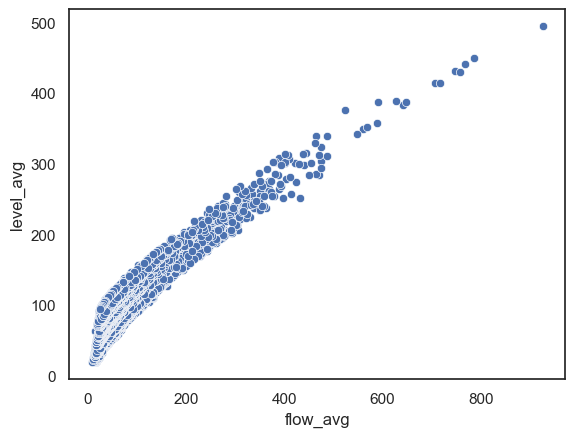

In [35]:
# looking into correlations flow_rate and water_level
sns.scatterplot(data=df_river, x='flow_avg', y='level_avg')


# Outliers

## Approach

There will be definitely outliers, especially in flow rate, water level and concentration of suspended solids (water variables). For example when there is a flood, you will have very high water level, flow rate and also a higher concentration of suspended solids. So is it to make sure that the values are for real. To find that out I have multiple steps to approve:
1. Looking into the correlation of the outliers. All 3 variables are correlated: it is very unlikely, that there are outliers in all variabels
2. Looking into the neighbored data of all the outliers
3. Take a deeper look into the extreme outliers (99% quantile)
4. Comparing the outliers with flood events

In [36]:
help(OutLiersBox)

Help on function OutLiersBox in module Functions_EDA:

OutLiersBox(df, nameOfFeature)
    Function to create a BoxPlot and visualise:
    - All Points in the Variable
    - Suspected Outliers in the variable



In [37]:
# looking into every variable for outliers

#for col in df_river:
    #OutLiersBox(df_river, col)
# no outliers for water temperature
# outiers are identified for flow_rate, water_level and concentration of suspended solids
# first looking deeper into water flow rate and water level, concentration of suspended solids is a little bit more complicated, because there were problems with the measurement station in 2024

# 1. Water Level Maximum

In [ ]:
# new columns for the states of outliers:
df_river['is_outlier_level_max'] = 'normal'
df_river['is_outlier_level_max_extreme'] = 'normal'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          24125 non-null  datetime64[ns]
 1   flow_avg                      24125 non-null  float64       
 2   flow_max                      19742 non-null  float64       
 3   flow_min                      19742 non-null  float64       
 4   level_avg                     18646 non-null  float64       
 5   level_max                     18646 non-null  float64       
 6   level_min                     18646 non-null  float64       
 7   concent_solids                21250 non-null  float64       
 8   water_temp_avg                15367 non-null  float64       
 9   water_temp_max                15367 non-null  float64       
 10  water_temp_min                15367 non-null  float64       
 11  is_outlier_level_max        

In [41]:
# looking deeper into the outliers water_level
Q1 = df_river['level_max'].quantile(.25)
Q3 = df_river['level_max'].quantile(.75)
IQR = Q3 - Q1
lower_limit_level_max = (Q1 - 1.5 * IQR)
upper_limit_level_max= (Q3 + 1.5 * IQR)

num_outliers_max_water_level = df_river[(df_river['level_max']) > upper_limit_level_max]
num_outliers_max_water_level

print("water_level_max ", IQR, "lower limit_level= ", lower_limit_level_max, "upper_limit_Level= ", upper_limit_level_max, "number of data: ", num_outliers_max_water_level.shape[0], "of " ,df_river['level_max'].count() )

water_level_max  41.0 lower limit_level=  5.5 upper_limit_Level=  169.5 number of data:  850 of  18646


In [42]:
# marking the outliers of water_level_max in 'is_outlier_level'
outlier_level_max_condition = (df_river['level_max'] > upper_limit_level_max)
df_river.loc[outlier_level_max_condition, 'is_outlier_level_max'] = 'suspected'
df_river[(df_river['is_outlier_level_max'] == 'suspected')]

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,water_temp_min,is_outlier_level_max,is_outlier_level_max_extreme
5494,1973-11-16,229.0,298.0,127.0,170.0,205.0,117.0,682.02,NaN,NaN,NaN,suspected,normal
5495,1973-11-17,243.0,272.0,208.0,176.0,191.0,159.0,280.75,NaN,NaN,NaN,suspected,normal
5703,1974-06-13,248.0,283.0,189.0,182.0,198.0,153.0,303.21,NaN,NaN,NaN,suspected,normal
5704,1974-06-14,235.0,288.0,170.0,175.0,201.0,142.0,199.18,NaN,NaN,NaN,suspected,normal
5737,1974-07-17,203.0,267.0,91.9,167.0,201.0,101.0,240.38,NaN,NaN,NaN,suspected,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24081,2024-10-06,141.0,159.0,126.0,176.0,187.0,167.0,NaN,11.4,11.9,11.1,suspected,normal
24084,2024-10-09,144.0,154.0,119.0,178.0,184.0,163.0,NaN,12.5,12.8,12.1,suspected,normal
24085,2024-10-10,139.0,146.0,127.0,175.0,179.0,168.0,NaN,12.2,12.3,11.9,suspected,normal
24086,2024-10-11,139.0,147.0,131.0,175.0,180.0,170.0,NaN,11.5,11.9,11.2,suspected,normal


### Next steps for handling the water level outliers
There are 850 outliers in the water level. To find out, if these are valid values, I first look into them by comparing them to timeframes of floods.
Because if they are lying in between floods this high values are important to keep.


In [43]:
# First checking the water level alerts for each day and lable it:
# water level alerts
alert_levels = {
    'level_1': 240,
    'level_2': 300,
    'level_3': 380,
    'level_4': 520
}

def determine_alert_level(value):
    if value >= alert_levels['level_4']:
        return 4
    elif value >= alert_levels['level_3']:
        return 3
    elif value >= alert_levels['level_2']:
        return 2
    elif value >= alert_levels['level_1']:
        return 1
    else:
        return 0

# adding a new column to fill it with the current water level alert
df_river['alert_level'] = df_river['level_max'].apply(determine_alert_level)

In [44]:
df_river[df_river['alert_level'] > 0]

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,water_temp_min,is_outlier_level_max,is_outlier_level_max_extreme,alert_level
5738,1974-07-18,380.0,470.0,267.0,255.0,295.0,201.0,327.71,NaN,NaN,NaN,suspected,normal,1
5739,1974-07-19,424.0,482.0,384.0,275.0,301.0,257.0,340.05,NaN,NaN,NaN,suspected,normal,2
5740,1974-07-20,379.0,420.0,343.0,254.0,273.0,238.0,366.06,NaN,NaN,NaN,suspected,normal,1
5741,1974-07-21,341.0,369.0,323.0,237.0,250.0,228.0,158.66,NaN,NaN,NaN,suspected,normal,1
5742,1974-07-22,310.0,355.0,269.0,222.0,244.0,202.0,118.99,NaN,NaN,NaN,suspected,normal,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24060,2024-09-15,378.0,441.0,310.0,303.0,333.0,269.0,NaN,12.4,13.2,11.7,suspected,normal,2
24061,2024-09-16,282.0,330.0,265.0,255.0,280.0,246.0,NaN,13.1,13.3,12.8,suspected,normal,1
24062,2024-09-17,401.0,443.0,328.0,314.0,334.0,279.0,NaN,12.4,12.9,12.0,suspected,normal,2
24063,2024-09-18,302.0,378.0,257.0,265.0,304.0,242.0,NaN,12.8,13.0,12.3,suspected,normal,2


In [45]:
df_river['alert_level'].value_counts()

alert_level
0    23945
1      122
2       39
3       18
4        1
Name: count, dtype: int64

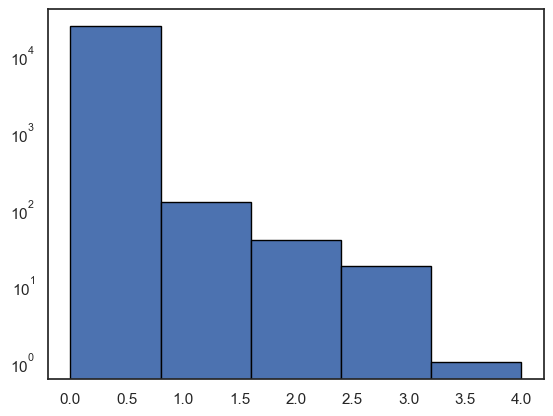

In [46]:
# plotting the distribution of all 4 water levels

plt.hist(df_river['alert_level'], bins=5, log=True, edgecolor='black')
plt.show()



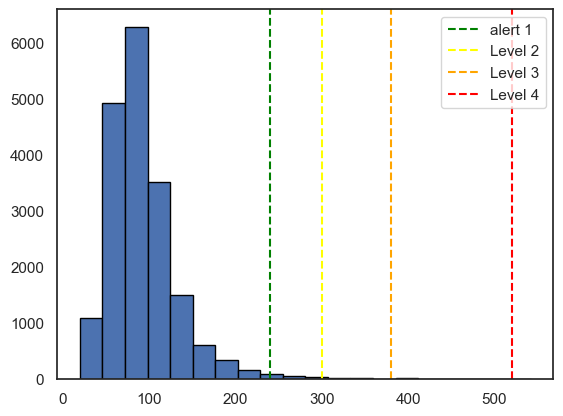

In [47]:
# plotting the distribution of all 4 water levels

plt.hist(df_river['level_max'], bins=20, edgecolor='black')
plt.axvline(x=alert_levels['level_1'], color='green', linestyle='--', label='alert 1')
plt.axvline(x=alert_levels['level_2'], color='yellow', linestyle='--', label='Level 2')
plt.axvline(x=alert_levels['level_3'], color='orange', linestyle='--', label='Level 3')
plt.axvline(x=alert_levels['level_4'], color='red', linestyle='--', label='Level 4')
plt.legend()
plt.show()

In [48]:
# now I want to identify and mark follwing days, where the water_levels are over 0
# new column for consecutives timeframes
df_river['is_flood_event'] = False

# creating groups for changes in water alert 
df_river['flood_group'] = (df_river['alert_level'] > 0).astype(int).diff().ne(0).cumsum()

# marking the days where water_alert > 0 as a flood event
df_river.loc[df_river['alert_level'] > 0, 'is_flood_event'] = True


In [49]:
# now finding the beginning and ending of flood events:
# Gruppen analysieren
flood_groups = df_river[df_river['is_flood_event']].groupby('flood_group').agg({
    'date': ['min', 'max', 'count'],
    'alert_level': 'max'
}).reset_index()

flood_groups.columns = ['flood_group', 'start_date', 'end_date', 'duration', 'max_alert_level']
flood_groups

,flood_group,start_date,end_date,duration,max_alert_level
0,2,1974-07-18,1974-07-22,5,2
1,4,1975-07-01,1975-07-03,3,1
2,6,1976-06-02,1976-06-03,2,1
3,8,1977-08-01,1977-08-03,3,2
4,10,1978-07-05,1978-07-05,1,1
...,...,...,...,...,...
57,116,2023-05-17,2023-05-18,2,1
58,118,2023-08-28,2023-08-31,4,2
59,120,2024-06-01,2024-06-08,8,2
60,122,2024-06-10,2024-06-11,2,1


In [50]:
# Funktion, um zu prüfen, ob ein Datum in einem Hochwasser-Zeitraum liegt
def check_flood(date, flood_groups):
    for _, row in flood_groups.iterrows():  # Iteriere durch alle Hochwasser-Ereignisse
        if date >= row['start_date'] and date <= row['end_date']:
            return 'confirmed'  # Datum liegt innerhalb eines Hochwasser-Zeitraums
    return 'invalid'  # Datum liegt außerhalb aller Hochwasser-Zeiträume

# Wende die Funktion auf die suspected Outliers an
df_river.loc[df_river['is_outlier_level_max'] == 'suspected', 'is_outlier_level_max'] = df_river.loc[
    df_river['is_outlier_level_max'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))


In [51]:
df_river['is_outlier_level_max'].value_counts()

is_outlier_level_max
normal       23275
invalid        670
confirmed      180
Name: count, dtype: int64

## percentil 99% water level max


In [52]:
# looking into the level by 99% quantile

Q1 = df_river['level_max'].quantile(.25)
Q3 = df_river['level_max'].quantile(.75)
Q_99 = df_river['level_max'].quantile(.99)
IQR = Q3 - Q1

upper_limit_99_level = (Q_99 + 3 * IQR)

num_outliers_max_water_level_extreme = df_river[(df_river['level_max']) > upper_limit_99_level]
num_outliers_max_water_level_extreme #.shape[0] #['Perceptions of corruption'].counts()

print("water_level 99% ", IQR, "upper limit extreme (99% Quantile)= ", upper_limit_99_level, "amount data: ", num_outliers_max_water_level_extreme.shape[0], "von " ,df_river['level_max'].count() )

water_level 99%  41.0 upper limit extreme (99% Quantile)=  361.0 amount data:  20 von  18646


In [53]:
# marking the outliers of water_level_max in 'is_outlier_level_extreme'
outlier_level_condition = (df_river['level_max'] > upper_limit_99_level)
df_river.loc[outlier_level_condition, 'is_outlier_level_max_extreme'] = 'suspected'
df_river[(df_river['is_outlier_level_max_extreme'] == 'suspected')]
df_river['is_outlier_level_max_extreme'].value_counts()

is_outlier_level_max_extreme
normal       24105
suspected       20
Name: count, dtype: int64

In [54]:
# looking into all suspected outliers and checking if the values are in between floods
df_river.loc[df_river['is_outlier_level_max_extreme'] == 'suspected', 'is_outlier_level_max_extreme'] = df_river.loc[
    df_river['is_outlier_level_max_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_level_max_extreme'].value_counts()

is_outlier_level_max_extreme
normal       24105
confirmed       20
Name: count, dtype: int64

## result: all extreme outliers are lying in between floods

# 1. Flow Rate Maximum

In [55]:
# new columns for the states of outliers:
df_river['is_outlier_flow_max'] = 'normal'
df_river['is_outlier_flow_max_extreme'] = 'normal'

In [56]:
# looking deeper into the outliers flow_rate
Q1 = df_river['flow_max'].quantile(.25)
Q3 = df_river['flow_max'].quantile(.75)
IQR = Q3 - Q1
upper_limit_flow_max = (Q3 + 1.5 * IQR)

num_outliers_max_flow = df_river[(df_river['flow_max']) > upper_limit_flow_max]
num_outliers_max_flow

print("flow_max ", IQR,  "upper_limit_flow= ", upper_limit_flow_max, "number of data: ", num_outliers_max_flow.shape[0], "of " ,df_river['flow_max'].count() )

flow_max  48.300000000000004 upper_limit_flow=  160.15 number of data:  1218 of  19742


In [57]:
# marking the outliers of flow_max in 'is_outlier_flow'
outlier_flow_max_condition = (df_river['flow_max'] > upper_limit_flow_max)
df_river.loc[outlier_flow_max_condition, 'is_outlier_flow_max'] = 'suspected'
df_river[(df_river['is_outlier_flow_max'] == 'suspected')]

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,water_temp_min,is_outlier_level_max,is_outlier_level_max_extreme,alert_level,is_flood_event,flood_group,is_outlier_flow_max,is_outlier_flow_max_extreme
4525,1971-03-23,132.0,162.0,104.0,NaN,NaN,NaN,67.62,NaN,NaN,NaN,normal,normal,0,False,1,suspected,normal
4602,1971-06-08,118.0,194.0,50.7,NaN,NaN,NaN,328.95,NaN,NaN,NaN,normal,normal,0,False,1,suspected,normal
4603,1971-06-09,130.0,173.0,98.6,NaN,NaN,NaN,184.95,NaN,NaN,NaN,normal,normal,0,False,1,suspected,normal
4716,1971-09-30,144.0,186.0,79.8,NaN,NaN,NaN,28.01,NaN,NaN,NaN,normal,normal,0,False,1,suspected,normal
4978,1972-06-18,149.0,193.0,106.0,NaN,NaN,NaN,67.35,NaN,NaN,NaN,normal,normal,0,False,1,suspected,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24066,2024-09-21,168.0,176.0,152.0,192.0,197.0,183.0,NaN,13.0,13.5,12.5,invalid,normal,0,False,125,suspected,normal
24073,2024-09-28,147.0,161.0,122.0,180.0,188.0,165.0,NaN,12.2,12.6,11.8,invalid,normal,0,False,125,suspected,normal
24074,2024-09-29,172.0,185.0,151.0,195.0,202.0,182.0,NaN,11.7,12.1,11.4,invalid,normal,0,False,125,suspected,normal
24075,2024-09-30,143.0,161.0,132.0,177.0,188.0,171.0,NaN,11.9,12.3,11.6,invalid,normal,0,False,125,suspected,normal


In [58]:
df_river['is_outlier_flow_max'].value_counts()

is_outlier_flow_max
normal       22907
suspected     1218
Name: count, dtype: int64

In [59]:
# looking into all suspected outliers and checking if the values are in between floods
df_river.loc[df_river['is_outlier_flow_max'] == 'suspected', 'is_outlier_flow_max'] = df_river.loc[
    df_river['is_outlier_flow_max'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_flow_max'].value_counts()

is_outlier_flow_max
normal       22907
invalid       1038
confirmed      180
Name: count, dtype: int64

## percentil 99% flow rate max

In [60]:
# looking into the flow rate by 99% quantile

Q1 = df_river['flow_max'].quantile(.25)
Q3 = df_river['flow_max'].quantile(.75)
Q_99 = df_river['flow_max'].quantile(.99)
IQR = Q3 - Q1

upper_limit_99_flow = (Q_99 + 3 * IQR)

num_outliers_max_flow_extreme = df_river[(df_river['flow_max']) > upper_limit_99_flow]
num_outliers_max_flow_extreme #.shape[0] #['Perceptions of corruption'].counts()

print("flow rate 99% ", IQR, "upper limit = ", upper_limit_99_flow, "amount data: ", num_outliers_max_flow_extreme.shape[0], "von " ,df_river['flow_max'].count() )

flow rate 99%  48.300000000000004 upper limit =  454.6700000000004 amount data:  51 von  19742


In [61]:
# marking the outliers of flow_max in 'is_outlier_flow_extreme'
outlier_flow_max_extreme_condition = (df_river['flow_max'] > upper_limit_99_flow)
df_river.loc[outlier_flow_max_extreme_condition, 'is_outlier_flow_max_extreme'] = 'suspected'
df_river[(df_river['is_outlier_flow_max_extreme'] == 'suspected')]
df_river['is_outlier_flow_max_extreme'].value_counts()

is_outlier_flow_max_extreme
normal       24074
suspected       51
Name: count, dtype: int64

In [62]:
# Check, if the extreme outliers are lying in time of floods
df_river.loc[df_river['is_outlier_flow_max_extreme'] == 'suspected', 'is_outlier_flow_max_extreme'] = df_river.loc[
    df_river['is_outlier_flow_max_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))

In [63]:
df_river['is_outlier_flow_max_extreme'].value_counts()

is_outlier_flow_max_extreme
normal       24074
confirmed       51
Name: count, dtype: int64

## results: all extreme flow outliers are lying in times of flood

# Water Level Average

In [64]:
# new columns for the states of outliers:
df_river['is_outlier_level_avg'] = 'normal'
df_river['is_outlier_level_avg_extreme'] = 'normal'

In [65]:
# looking deeper into the outliers water_level
Q1 = df_river['level_avg'].quantile(.25)
Q3 = df_river['level_avg'].quantile(.75)
Q99 = df_river['level_avg'].quantile(.99)
IQR = Q3 - Q1

upper_limit_level_avg = (Q3 + 1.5 * IQR)
upper_limit_level_avg_99 = (Q99 + 3 * IQR)

num_outliers_avg_water_level = df_river[(df_river['level_avg']) > upper_limit_level_avg]
num_outliers_avg_water_level_extreme = df_river[(df_river['level_avg']) > upper_limit_level_avg_99]

print("water_level_avg ", IQR,  "upper_limit_Level_avg= ", upper_limit_level_avg, "number of data: ", num_outliers_avg_water_level.shape[0], "of " ,df_river['level_avg'].count(),
      "water_level_avg 99% ", "upper_limit_Level_avg= ", upper_limit_level_avg_99, "number of data: ", num_outliers_avg_water_level_extreme.shape[0], "of " ,df_river['level_avg'].count())

water_level_avg  41.0 upper_limit_Level_avg=  161.5 number of data:  667 of  18646 water_level_avg 99%  upper_limit_Level_avg=  335.0 number of data:  18 of  18646


In [66]:
# marking the outliers of water_level_avg in 'is_outlier_level_avg'
outlier_level_avg_condition = (df_river['level_avg'] > upper_limit_level_avg)
df_river.loc[outlier_level_avg_condition, 'is_outlier_level_avg'] = 'suspected'
df_river['is_outlier_level_avg'].value_counts()

is_outlier_level_avg
normal       23458
suspected      667
Name: count, dtype: int64

In [67]:
# looking into all suspected outliers and checking if the values are in between floods
df_river.loc[df_river['is_outlier_level_avg'] == 'suspected', 'is_outlier_level_avg'] = df_river.loc[
    df_river['is_outlier_level_avg'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_level_avg'].value_counts()

is_outlier_level_avg
normal       23458
invalid        493
confirmed      174
Name: count, dtype: int64

In [68]:
# marking the outliers of level_avg in 'is_outlier_level_avg_extreme'
outlier_level_avg_extreme_condition = (df_river['level_avg'] > upper_limit_level_avg_99)
df_river.loc[outlier_level_avg_extreme_condition, 'is_outlier_level_avg_extreme'] = 'suspected'
df_river[(df_river['is_outlier_level_avg_extreme'] == 'suspected')]
df_river['is_outlier_level_avg_extreme'].value_counts()

is_outlier_level_avg_extreme
normal       24107
suspected       18
Name: count, dtype: int64

In [69]:
# Check, if the extreme outliers are lying in time of floods
df_river.loc[df_river['is_outlier_level_avg_extreme'] == 'suspected', 'is_outlier_level_avg_extreme'] = df_river.loc[
    df_river['is_outlier_level_avg_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_level_avg_extreme'].value_counts()

is_outlier_level_avg_extreme
normal       24107
confirmed       18
Name: count, dtype: int64

# Flow Rate Average

In [70]:
# new columns for the states of outliers:
df_river['is_outlier_flow_avg'] = 'normal'
df_river['is_outlier_flow_avg_extreme'] = 'normal'

In [71]:
# looking into the flow rate avg by 75% ans 99% quantile

Q1 = df_river['flow_avg'].quantile(.25)
Q3 = df_river['flow_avg'].quantile(.75)
Q_99 = df_river['flow_avg'].quantile(.99)
IQR = Q3 - Q1

upper_limit_flow_avg = (Q3 + 1.5 * IQR)
upper_limit_99_flow_avg = (Q_99 + 3 * IQR)

num_outliers_flow_avg = df_river[(df_river['flow_avg']) > upper_limit_flow_avg]
num_outliers_flow_avg_extreme = df_river[(df_river['flow_avg']) > upper_limit_99_flow_avg]

print("flow_rate avg ", IQR, "upper limit flow avg= ", upper_limit_flow_avg, "amount data: ", num_outliers_flow_avg.shape[0], "von " ,df_river['flow_avg'].count(),
      "flow_rate avg extreme", IQR, "upper limit flow avg 99%= ", upper_limit_99_flow_avg, "amount data: ", num_outliers_flow_avg_extreme.shape[0], "von " ,df_river['flow_avg'].count())

flow_rate avg  45.900000000000006 upper limit flow avg=  146.75 amount data:  1330 von  24125 flow_rate avg extreme 45.900000000000006 upper limit flow avg 99%=  399.70000000000005 amount data:  54 von  24125


In [72]:
# marking the outliers of flow_avg in 'is_outlier_flow'
outlier_flow_avg_condition = (df_river['flow_avg'] > upper_limit_flow_avg)
df_river.loc[outlier_flow_avg_condition, 'is_outlier_flow_avg'] = 'suspected'
df_river['is_outlier_flow_avg'].value_counts()

is_outlier_flow_avg
normal       22795
suspected     1330
Name: count, dtype: int64

In [73]:
# looking into all suspected outliers and checking if the values are in between floods
df_river.loc[df_river['is_outlier_flow_avg'] == 'suspected', 'is_outlier_flow_avg'] = df_river.loc[
    df_river['is_outlier_flow_avg'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_flow_avg'].value_counts()

is_outlier_flow_avg
normal       22795
invalid       1152
confirmed      178
Name: count, dtype: int64

In [74]:
# marking the outliers of flow_avg in 'is_outlier_flow_avg_extreme'
outlier_flow_avg_extreme_condition = (df_river['flow_avg'] > upper_limit_99_flow_avg)
df_river.loc[outlier_flow_avg_extreme_condition, 'is_outlier_flow_avg_extreme'] = 'suspected'
df_river[(df_river['is_outlier_flow_avg_extreme'] == 'suspected')]
df_river['is_outlier_flow_avg_extreme'].value_counts()

is_outlier_flow_avg_extreme
normal       24071
suspected       54
Name: count, dtype: int64

In [75]:
# Check, if the extreme outliers are lying in time of floods
df_river.loc[df_river['is_outlier_flow_avg_extreme'] == 'suspected', 'is_outlier_flow_avg_extreme'] = df_river.loc[
    df_river['is_outlier_flow_avg_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))

In [76]:
df_river['is_outlier_flow_avg_extreme'].value_counts()

is_outlier_flow_avg_extreme
normal       24071
confirmed       43
invalid         11
Name: count, dtype: int64

In [77]:
df_river[df_river['is_outlier_flow_avg_extreme']== 'invalid']

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,...,is_outlier_level_max_extreme,alert_level,is_flood_event,flood_group,is_outlier_flow_max,is_outlier_flow_max_extreme,is_outlier_level_avg,is_outlier_level_avg_extreme,is_outlier_flow_avg,is_outlier_flow_avg_extreme
2392,1965-05-20,432.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
2414,1965-06-11,582.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
2415,1965-06-12,569.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
2416,1965-06-13,495.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
2417,1965-06-14,458.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
2418,1965-06-15,422.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
2822,1966-07-24,485.0,NaN,NaN,NaN,NaN,NaN,705.05,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
4300,1970-08-10,542.0,NaN,NaN,NaN,NaN,NaN,927.90,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
4301,1970-08-11,485.0,NaN,NaN,NaN,NaN,NaN,404.03,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid
4302,1970-08-12,482.0,NaN,NaN,NaN,NaN,NaN,350.17,NaN,NaN,...,normal,0,False,1,normal,normal,normal,normal,invalid,invalid


In [78]:
# Df with data of extreme values for flow rate and water level, for example occuring in floods
df_floods = pd.DataFrame(
    {
        "date" : ['2005-08-24', '1999-05-22', '2013-06-03', '1981-07-20', '1979-06-18', '1965-06-11'],
        "water_level_flood": [542, 469, 432, 424, 424, np.nan],
        "flow_rate_flood": [1050, 830, 761, np.nan, 728, 705]},
        index=[1,2,3,4,5,6])
df_floods

,date,water_level_flood,flow_rate_flood
1,2005-08-24,542.0,1050.0
2,1999-05-22,469.0,830.0
3,2013-06-03,432.0,761.0
4,1981-07-20,424.0,NaN
5,1979-06-18,424.0,728.0
6,1965-06-11,NaN,705.0


# Comparing the median of data including and excluding the outliers




## Water Level: Comparison Of The Median

In [86]:
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          24125 non-null  datetime64[ns]
 1   flow_avg                      24125 non-null  float64       
 2   flow_max                      19742 non-null  float64       
 3   flow_min                      19742 non-null  float64       
 4   level_avg                     18646 non-null  float64       
 5   level_max                     18646 non-null  float64       
 6   level_min                     18646 non-null  float64       
 7   concent_solids                21250 non-null  float64       
 8   water_temp_avg                15367 non-null  float64       
 9   water_temp_max                15367 non-null  float64       
 10  water_temp_min                15367 non-null  float64       
 11  is_outlier_level_max        

In [102]:
# first water level max:

level_max_median = df_river['level_max'].median()
level_max_median_excl_outliers = df_river[df_river['is_outlier_level_max'] != 'invalid']['level_max'].median()

diff_median_max_level_perc = (level_max_median - level_max_median_excl_outliers)/level_max_median
print("The general mean off the water level (max) differs ", round(diff_median_max_level_perc, 2), ' percent from the median of the data excluding the outliers')


The general mean off the water level (max) differs  0.02  percent from the median of the data excluding the outliers


In [117]:
# function to find out all the difference of the medians:
def diff_median(median_incl, median_excl):
    median1 = median_incl.median()
    median2 = median_excl.median()
    
    diff_median_perc = (median1 - median2)/median1 * 100
    print("general median: ", median1, "\nmedian excluding outliers: ", median2,
        "\nThe general mean differs ", round(diff_median_perc, 2), ' percent from the median of the data excluding the outliers')

In [118]:
# water level max:
diff_median(df_river['level_max'],df_river[df_river['is_outlier_level_max'] != 'invalid']['level_max'])

general median:  86.0 
median excluding outliers:  84.0 
The general mean differs  2.33  percent from the median of the data excluding the outliers


In [119]:
# water level avg:
diff_median(df_river['level_avg'], df_river[df_river['is_outlier_level_avg'] != 'invalid']['level_avg'])


general median:  78.0 
median excluding outliers:  77.0 
The general mean differs  1.28  percent from the median of the data excluding the outliers


In [120]:
# flow rate max:
diff_median(df_river['flow_max'], df_river[df_river['is_outlier_flow_max'] != 'invalid']['flow_max'])


general median:  59.2 
median excluding outliers:  56.9 
The general mean differs  3.89  percent from the median of the data excluding the outliers


In [121]:
diff_median(df_river['flow_avg'], df_river[df_river['is_outlier_flow_avg'] != 'invalid']['flow_avg'])


general median:  51.2 
median excluding outliers:  49.0 
The general mean differs  4.3  percent from the median of the data excluding the outliers


In [468]:
# Divide the data into the 4 seasons:

df_river['month'] = df_river['date'].dt.month
df_spring = df_river[df_river['month'].isin([3,4,5])].sort_values('date')
df_summer = df_river[df_river['month'].isin([6,7,8])].sort_values('date')
df_autumn = df_river[df_river['month'].isin([9,10,11])].sort_values('date')
df_winter = df_river[df_river['month'].isin([12,1,2])].sort_values('date')

# caculating the rolling average:

df_spring['rolling_avg_level_max'] = df_spring['level_max'].rolling(window=30).mean()
df_spring[['date', 'level_max', 'rolling_avg_level_max']].tail(20)

,date,level_max,rolling_avg_level_max
23934,2024-05-12,128.0,126.133333
23935,2024-05-13,116.0,127.000000
23936,2024-05-14,117.0,128.000000
23937,2024-05-15,119.0,128.833333
23938,2024-05-16,107.0,129.200000
23939,2024-05-17,108.0,129.133333
23940,2024-05-18,113.0,129.100000
23941,2024-05-19,116.0,129.066667
23942,2024-05-20,114.0,128.966667
23943,2024-05-21,108.0,128.766667


In [469]:
df_spring[df_spring['is_outlier_level_max'] == 'invalid'][['date', 'level_max', 'rolling_avg_level_max']]

,date,level_max,rolling_avg_level_max
7129,1978-05-09,192.0,69.566667
7497,1979-05-12,186.0,94.366667
7498,1979-05-13,184.0,96.833333
8167,1981-03-12,194.0,100.466667
8168,1981-03-13,208.0,102.466667
...,...,...,...
23930,2024-05-08,171.0,119.966667
23931,2024-05-09,175.0,122.366667
23950,2024-05-28,201.0,131.666667
23951,2024-05-29,198.0,133.766667


In [481]:
df_spring['dev_spring_level_max'] = abs(df_spring['rolling_avg_level_max'] - df_spring['level_max'])
df_spring['dev_perc30_level_max'] = (df_spring['dev_spring_level_max'] / df_spring['rolling_avg_level_max']) * 100
df_spring[(df_spring['is_outlier_level_max'] == 'invalid') & (df_spring['dev_perc30_level_max'] < 20)][['date', 'level_max', 'rolling_avg_level_max', 'dev_perc30_level_max']]

,date,level_max,rolling_avg_level_max,dev_perc30_level_max
14807,1999-05-17,194.0,164.933333,17.623282
14808,1999-05-18,189.0,168.200000,12.366231
14809,1999-05-19,170.0,170.400000,0.234742
14818,1999-05-28,226.0,242.600000,6.842539
15105,2000-03-10,194.0,227.866667,14.862493
15106,2000-03-11,198.0,225.300000,12.117177
15114,2000-03-19,224.0,216.166667,3.623747
15115,2000-03-20,185.0,211.200000,12.405303
15132,2000-04-06,171.0,159.300000,7.344633
15175,2000-05-19,176.0,157.066667,12.054329


In [482]:
df_summer['rolling_avg_level_max'] = df_summer['level_max'].rolling(window=7).mean()
df_summer[df_summer['is_outlier_level_max'] == 'invalid'][['date', 'level_max', 'rolling_avg_level_max']]

,date,level_max,rolling_avg_level_max
5703,1974-06-13,198.0,113.000000
5704,1974-06-14,201.0,129.000000
5737,1974-07-17,201.0,120.857143
5743,1974-07-23,202.0,252.285714
5745,1974-07-25,188.0,229.571429
...,...,...,...
23994,2024-07-11,192.0,174.714286
23995,2024-07-12,170.0,176.571429
23996,2024-07-13,176.0,178.000000
24033,2024-08-19,192.0,136.285714


In [431]:
df_autumn['rolling_avg_level_max'] = df_autumn['level_max'].rolling(window=7).mean()
df_autumn[df_autumn['is_outlier_level_max'] == 'invalid'][['date', 'level_max', 'rolling_avg_level_max']]

,date,level_max,rolling_avg_level_max
5494,1973-11-16,205.0,86.285714
5495,1973-11-17,191.0,106.428571
7251,1978-09-08,207.0,94.428571
7252,1978-09-09,179.0,107.714286
7256,1978-09-13,183.0,143.857143
...,...,...,...
24081,2024-10-06,187.0,181.000000
24084,2024-10-09,184.0,179.142857
24085,2024-10-10,179.0,180.857143
24086,2024-10-11,180.0,180.428571


In [487]:
df_winter['rolling_avg_level_max'] = df_winter['level_max'].rolling(window=7).mean()
df_winter[df_winter['is_outlier_level_max'] == 'invalid'][['date', 'level_max', 'rolling_avg_level_max']].count()

date                     48
level_max                48
rolling_avg_level_max    48
dtype: int64

In [488]:
df_winter['dev_winter_level_max'] = abs(df_winter['rolling_avg_level_max'] - df_winter['level_max'])
df_winter['dev_perc30_level_max'] = (df_winter['dev_winter_level_max'] / df_winter['rolling_avg_level_max']) * 100
df_winter[(df_winter['is_outlier_level_max'] == 'invalid') & (df_winter['dev_perc30_level_max'] < 20)][['date', 'level_max', 'rolling_avg_level_max', 'dev_perc30_level_max']].count()

date                     10
level_max                10
rolling_avg_level_max    10
dev_perc30_level_max     10
dtype: int64

# ARCHIVE

In [126]:
for index, row in merged_df_river[merged_df_river['is_outlier'] == 'suspected'].iterrows():
    # extract neighbouring values (±10 rows)
    neighbors = merged_df_river.loc[max(0, index-10):min(len(merged_df_river)-1, index+10), 'level_avg']
    
    # Checking the differences fo the values (absolutely)
    max_diff = neighbors.max() - neighbors.min()
    
    # condition: no big differences => plausible
    # treshold: sd *2
    treshold = merged_df_river['level_avg'].std()*2
    if max_diff < treshold: 
        merged_df_river.loc[index, 'is_outlier'] = 'confirmed'
    else:
        merged_df_river.loc[index, 'is_outlier'] = 'invalid'

In [130]:
merged_df_river[merged_df_river['is_outlier'] == 'invalid']

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,water_temp_min,is_outlier,is_outlier_extreme,date_diff
5494,1973-11-16,229.0,298.0,127.0,170.0,205.0,117.0,682.02,NaN,NaN,NaN,invalid,normal,1 days
5495,1973-11-17,243.0,272.0,208.0,176.0,191.0,159.0,280.75,NaN,NaN,NaN,invalid,normal,1 days
5703,1974-06-13,248.0,283.0,189.0,182.0,198.0,153.0,303.21,NaN,NaN,NaN,invalid,normal,1 days
5704,1974-06-14,235.0,288.0,170.0,175.0,201.0,142.0,199.18,NaN,NaN,NaN,invalid,normal,1 days
5737,1974-07-17,203.0,267.0,91.9,167.0,201.0,101.0,240.38,NaN,NaN,NaN,invalid,normal,1 days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24072,2024-09-27,120.0,126.0,106.0,164.0,167.0,155.0,NaN,13.1,13.4,12.6,invalid,normal,1 days
24073,2024-09-28,147.0,161.0,122.0,180.0,188.0,165.0,NaN,12.2,12.6,11.8,invalid,normal,1 days
24074,2024-09-29,172.0,185.0,151.0,195.0,202.0,182.0,NaN,11.7,12.1,11.4,invalid,normal,1 days
24086,2024-10-11,139.0,147.0,131.0,175.0,180.0,170.0,NaN,11.5,11.9,11.2,invalid,normal,1 days


In [88]:
df_outliers_flow_rate.head()

,date,flow_avg
170,1959-04-20,164.0
182,1959-05-02,195.0
183,1959-05-03,154.0
224,1959-06-13,186.0
225,1959-06-14,351.0


In [91]:
# joining the datasets by date
df_outliers_flow_level = pd.merge(df_outliers_flow_rate, df_outliers_water_level, how='outer', on='date')
df_outliers_flow_level.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       1373 non-null   datetime64[ns]
 1   flow_avg   1330 non-null   float64       
 2   level_avg  667 non-null    float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 32.3 KB


In [90]:
# creating a new dataframe of the outliers in water level:
df_outliers_water_level = merged_df_river[merged_df_river['level_avg'] > upper_limit][['date','level_avg']]
df_outliers_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 667 entries, 5494 to 24087
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       667 non-null    datetime64[ns]
 1   level_avg  667 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 15.6 KB


<AxesSubplot:xlabel='flow_avg', ylabel='level_avg'>

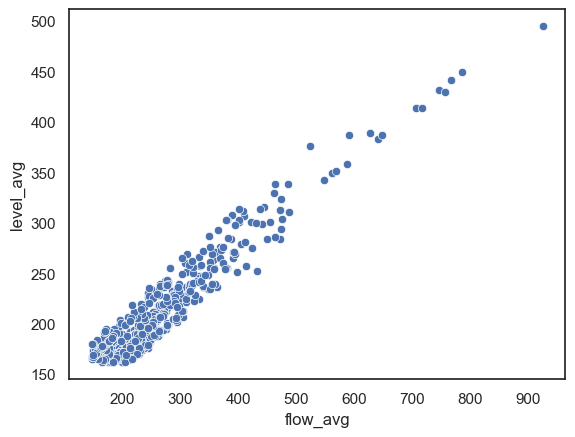

In [ ]:
sns.scatterplot(data=df_outliers_flow_level, x='flow_avg', y='level_avg')


In [173]:
df_outliers_flow_level['date_diff'] = df_outliers_flow_level['date'].diff()

df_outliers_flow_level_isolated = df_outliers_flow_level[df_outliers_flow_level['date_diff'] != pd.Timedelta(days=1)]
df_outliers_flow_level_isolated


,date,flow_avg,level_avg,date_diff
0,1959-04-20,164.0,NaN,NaT
1,1959-05-02,195.0,NaN,12 days
3,1959-06-13,186.0,NaN,41 days
8,1959-06-30,172.0,NaN,13 days
12,1959-07-16,293.0,NaN,13 days
...,...,...,...,...
1356,2024-08-19,NaN,167.0,38 days
1358,2024-09-23,NaN,175.0,34 days
1360,2024-09-27,NaN,164.0,3 days
1361,2024-09-30,NaN,177.0,3 days


In [ ]:
# isolated values df_outliers_flow_level_isolated: are they outliers or are the neighbour values similar, is there a trend you can see?
for index in df_outliers_flow_level_isolated:
    neighbours = df_outliers_flow_level_isolated.loc[index-10:index+10]

In [64]:
# creating an excel-file to import it into powerBI:
df_outliers_rate_level.to_excel(excel_writer='outliersRateLevel.xlsx', sheet_name='data')

In [118]:
# creating a new dataframe of the extreme outliers in flow_rate:
df_outliers_extreme_flow_rate = merged_df_river[merged_df_river['flow_avg'] > upper_limit_99_flow][['date','flow_avg']]
df_outliers_extreme_flow_rate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, 2392 to 24062
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      54 non-null     datetime64[ns]
 1   flow_avg  54 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.3 KB


In [77]:
# creating a new dataframe of the extreme outliers in water level:
df_outliers_extreme_water_level = merged_df_river[merged_df_river['level_avg'] > upper_limit_99][['date','level_avg']]
df_outliers_extreme_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18 entries, 7534 to 22558
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       18 non-null     datetime64[ns]
 1   level_avg  18 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 432.0 bytes


In [84]:
df_merged_outliers_extreme_flow_level.to_excel(excel_writer='outliersFlowLevelExtreme.xlsx', sheet_name='data')

In [81]:
df_merged_outliers_extreme_flow_level = pd.merge(df_outliers_extreme_flow_rate, df_outliers_extreme_water_level, how='outer', on='date')
df_merged_outliers_extreme_flow_level.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       54 non-null     datetime64[ns]
 1   flow_avg   54 non-null     float64       
 2   level_avg  18 non-null     float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 1.4 KB


# Join

## 6.b) Joining all the DataFrame by starting with the least rows to avoid NaNs
1. temp and joining by all other variables to see, if there's different amount of dates

So, there is a difference in all variables regarding to the date!
Following steps are necessary: 
1. Creating a DataFrame with all unique days


In [139]:
filtered_df = merged_df.dropna(subset=['Mittelwert_x', 'Mittelwert_x', 'Schwebstoff-Konzentration [g/m^3]', 'Maximum'], how='all')

In [135]:
all_dates = pd.concat([df_flow_rate['Datum'], df_water_level['Datum'], df_concent_solids['Datum'], df_water_temperature['Datum']]).drop_duplicates()
all_dates_df = pd.DataFrame({'Datum': all_dates})
merged_df = all_dates_df.merge(df_flow_rate, on='Datum', how='left')
merged_df = merged_df.merge(df_water_level, on='Datum', how='left')
merged_df = merged_df.merge(df_concent_solids, on='Datum', how='left')
merged_df = merged_df.merge(df_water_temperature, on='Datum', how='left')

In [136]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 5 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Datum                              24125 non-null  datetime64[ns]
 1   Mittelwert_x                       24125 non-null  float64       
 2   Mittelwert_y                       18646 non-null  float64       
 3   Schwebstoff-Konzentration [g/m^3]  21250 non-null  float64       
 4   Maximum                            15367 non-null  float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 942.5 KB


In [140]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 5 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Datum                              24125 non-null  datetime64[ns]
 1   Mittelwert_x                       24125 non-null  float64       
 2   Mittelwert_y                       18646 non-null  float64       
 3   Schwebstoff-Konzentration [g/m^3]  21250 non-null  float64       
 4   Maximum                            15367 non-null  float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 942.5 KB


In [ ]:
filtered

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.58,"74,4",NaN,NaN,Geprueft
1,02.11.58,"77,9",NaN,NaN,Geprueft
2,03.11.58,"72,2",NaN,NaN,Geprueft
3,04.11.58,93,NaN,NaN,Geprueft
4,05.11.58,121,NaN,NaN,Geprueft
5,06.11.58,"77,9",NaN,NaN,Geprueft
6,07.11.58,"65,6",NaN,NaN,Geprueft
7,08.11.58,"61,3",NaN,NaN,Geprueft
8,09.11.58,"54,1",NaN,NaN,Geprueft
9,10.11.58,"53,1",NaN,NaN,Geprueft


In [13]:
# checking NaNs:
df_river_flow_rate.isna().sum()

Datum            0
Mittelwert       0
Maximum       4383
Minimum       4383
Prüfstatus       0
dtype: int64

In [14]:
# checking, if there are NaNs after June 2011
df_river_flow_rate_nans = df_river_flow_rate[(df_river_flow_rate['Maximum']).isna() | (df_river_flow_rate['Minimum'].isna())]
df_river_flow_rate_nans

# NaNs of Maximum and Minimum after 31.10.1970, afterwards no NaNs

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.58,"74,4",NaN,NaN,Geprueft
1,02.11.58,"77,9",NaN,NaN,Geprueft
2,03.11.58,"72,2",NaN,NaN,Geprueft
3,04.11.58,93,NaN,NaN,Geprueft
4,05.11.58,121,NaN,NaN,Geprueft
...,...,...,...,...,...
4378,27.10.70,"56,2",NaN,NaN,Geprueft
4379,28.10.70,"59,5",NaN,NaN,Geprueft
4380,29.10.70,"67,4",NaN,NaN,Geprueft
4381,30.10.70,"74,9",NaN,NaN,Geprueft


In [15]:
# loading and putting all dataframes together: water_quality
df_water_quality = df_concat('../datasets/river/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.csv','../datasets/river/fluesse-schwebstoff/16005701_01.01.2024_31.08.2024_tmw_0.csv', ";")


dataframe for is completed. There are 21250 rows.


In [16]:
df_water_quality.head(10)
# first data from 01.10.1965

,Zeitpunkt,Schwebstoff-Konzentration [g/m^3],Prüfstatus,Schwebstoff-Fracht [t],Prüfstatus.1,Schwebstoff-Abtrag [t/m^2],Prüfstatus.2,Schwebstoff-Transport [kg/s],Prüfstatus.3
0,31.10.65,25,Rohdaten,"47,85",Rohdaten,"0,02",Rohdaten,"0,55",Rohdaten
1,01.11.65,"18,06",Rohdaten,"32,47",Rohdaten,"0,01",Rohdaten,"0,38",Rohdaten
2,02.11.65,"11,57",Rohdaten,"20,55",Rohdaten,"0,01",Rohdaten,"0,24",Rohdaten
3,03.11.65,"11,11",Rohdaten,"27,77",Rohdaten,"0,01",Rohdaten,"0,32",Rohdaten
4,04.11.65,"9,88",Rohdaten,"26,54",Rohdaten,"0,01",Rohdaten,"0,31",Rohdaten
5,05.11.65,"5,87",Rohdaten,"16,67",Rohdaten,"0,01",Rohdaten,"0,19",Rohdaten
6,06.11.65,"5,56",Rohdaten,"14,31",Rohdaten,"0,01",Rohdaten,"0,17",Rohdaten
7,07.11.65,"5,56",Rohdaten,"12,34",Rohdaten,0,Rohdaten,"0,14",Rohdaten
8,08.11.65,"6,79",Rohdaten,"13,54",Rohdaten,"0,01",Rohdaten,"0,16",Rohdaten
9,09.11.65,"12,04",Rohdaten,"27,42",Rohdaten,"0,01",Rohdaten,"0,32",Rohdaten


In [17]:
df_water_quality.info()
# non NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Zeitpunkt                          21250 non-null  object
 1   Schwebstoff-Konzentration [g/m^3]  21250 non-null  object
 2   Prüfstatus                         21250 non-null  object
 3   Schwebstoff-Fracht [t]             21250 non-null  object
 4   Prüfstatus.1                       21250 non-null  object
 5   Schwebstoff-Abtrag [t/m^2]         21250 non-null  object
 6   Prüfstatus.2                       21250 non-null  object
 7   Schwebstoff-Transport [kg/s]       21250 non-null  object
 8   Prüfstatus.3                       21250 non-null  object
dtypes: object(9)
memory usage: 1.6+ MB


In [18]:
# loading and putting all dataframes together: water_level
df_water_level = df_concat('../datasets/river/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0-1.csv', '../datasets/river/fluesse-wasserstand/16005701_01.01.2024_31.08.2024_tmw_0.csv', ';')

dataframe for is completed. There are 18567 rows.


In [19]:
df_water_level.head(10)
# first data from 01.11.1973

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.73,50,58,44,Geprueft
1,02.11.73,45,53,43,Geprueft
2,03.11.73,49,57,43,Geprueft
3,04.11.73,45,57,31,Geprueft
4,05.11.73,46,52,35,Geprueft
5,06.11.73,49,54,43,Geprueft
6,07.11.73,51,54,43,Geprueft
7,08.11.73,48,54,40,Geprueft
8,09.11.73,46,53,33,Geprueft
9,10.11.73,43,50,38,Geprueft


In [20]:
df_water_level.info()
# no NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 18567 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datum       18567 non-null  object
 1   Mittelwert  18567 non-null  int64 
 2   Maximum     18567 non-null  int64 
 3   Minimum     18567 non-null  int64 
 4   Prüfstatus  18567 non-null  object
dtypes: int64(3), object(2)
memory usage: 870.3+ KB


In [21]:
# loading and putting all dataframes together: daily_water_temperature
df_daily_water_temperature = df_concat('/Users/natalie/Documents/_DA_course/finalProject_/finalProjectNatalie/datasets/river/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.csv','/Users/natalie/Documents/_DA_course/finalProject_/finalProjectNatalie/datasets/river/fluesse-wassertemperatur/16005701_01.01.2024_31.08.2024_tmw_0.csv', ';')

dataframe for is completed. There are 15288 rows.


In [22]:
df_daily_water_temperature.head(10)
# data from 01.11.1980

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.80,"8,1","8,1","8,1",Geprueft
1,02.11.80,"7,3","7,3","7,3",Geprueft
2,03.11.80,"5,8","5,8","5,8",Geprueft
3,04.11.80,"5,6","5,6","5,6",Geprueft
4,05.11.80,"4,8","4,8","4,8",Geprueft
5,06.11.80,"4,7","4,7","4,7",Geprueft
6,07.11.80,"6,1","6,1","6,1",Geprueft
7,08.11.80,"7,7","7,7","7,7",Geprueft
8,09.11.80,"7,5","7,5","7,5",Geprueft
9,10.11.80,"7,6","7,6","7,6",Geprueft


In [23]:
df_daily_water_temperature.info()
# non NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 15288 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datum       15288 non-null  object
 1   Mittelwert  15288 non-null  object
 2   Maximum     15288 non-null  object
 3   Minimum     15288 non-null  object
 4   Prüfstatus  15288 non-null  object
dtypes: object(5)
memory usage: 716.6+ KB


In [24]:
# creating 1 dataframe for the water-variables river flow rate, water quality: suspended solids, water level, daily water temperatures
# checking all columns and potientially rename them:
#df_river_flow_rate.columns: done
#df_water_level.columns
#df_water_quality.columns
#df_daily_water_temperature.columns

In [25]:
# renaming the columns of df_river_flow_rate:
df_river_flow_rate = df_river_flow_rate.rename(columns={'Mittelwert' : 'avg_flow_rate',
                                   'Maximum' : 'max_flow_rate',
                                   'Minimum' : 'min_flow_rate'})
df_river_flow_rate.columns


Index(['Datum', 'avg_flow_rate', 'max_flow_rate', 'min_flow_rate',
       'Prüfstatus'],
      dtype='object')

In [26]:
# dropping the column 'Prüfstatus'
df_river_flow_rate = df_river_flow_rate.drop(columns='Prüfstatus')
df_river_flow_rate.columns

Index(['Datum', 'avg_flow_rate', 'max_flow_rate', 'min_flow_rate'], dtype='object')

In [27]:
df_river_flow_rate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24046 entries, 0 to 243
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Datum          24046 non-null  object
 1   avg_flow_rate  24046 non-null  object
 2   max_flow_rate  19663 non-null  object
 3   min_flow_rate  19663 non-null  object
dtypes: object(4)
memory usage: 939.3+ KB


In [28]:
# renaming the columns of df_river_water_level:
df_water_level = df_water_level.rename(columns={'Mittelwert' : 'avg_water_level',
                                   'Maximum' : 'max_water_level',
                                   'Minimum' : 'min_water_level'})
df_water_level.columns

Index(['Datum', 'avg_water_level', 'max_water_level', 'min_water_level',
       'Prüfstatus'],
      dtype='object')

In [29]:
# dropping Prüfstatus:
df_water_level = df_water_level.drop(columns='Prüfstatus')
df_water_level.columns

Index(['Datum', 'avg_water_level', 'max_water_level', 'min_water_level'], dtype='object')

In [30]:
# renaming the columns of df_river_water_temperature:
df_water_quality = df_water_quality.rename(columns={'Zeitpunkt' : 'Datum',
                                                    'Schwebstoff-Konzentration [g/m^3]' : 'suspended_solids_concentration',
                                                    'Schwebstoff-Fracht [t]' : 'suspended_solid_load',
                                                    'Schwebstoff-Abtrag [t/m^2]' : 'suspended_sediment_erosion',
                                                    'Schwebstoff-Transport [kg/s]' : 'suspended_sediment_transport'})
df_water_quality.columns

Index(['Datum', 'suspended_solids_concentration', 'Prüfstatus',
       'suspended_solid_load', 'Prüfstatus.1', 'suspended_sediment_erosion',
       'Prüfstatus.2', 'suspended_sediment_transport', 'Prüfstatus.3'],
      dtype='object')

In [31]:
df_water_quality = df_water_quality.drop(columns=['Prüfstatus', 'Prüfstatus.1','Prüfstatus.2', 'Prüfstatus.3'])
df_water_quality.columns

Index(['Datum', 'suspended_solids_concentration', 'suspended_solid_load',
       'suspended_sediment_erosion', 'suspended_sediment_transport'],
      dtype='object')

In [32]:
df_water_quality.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 5 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Datum                           21250 non-null  object
 1   suspended_solids_concentration  21250 non-null  object
 2   suspended_solid_load            21250 non-null  object
 3   suspended_sediment_erosion      21250 non-null  object
 4   suspended_sediment_transport    21250 non-null  object
dtypes: object(5)
memory usage: 996.1+ KB


In [33]:
# renaming the columns of df_river_water_temperature:
df_daily_water_temperature = df_daily_water_temperature.rename(columns={'Mittelwert' : 'avg_water_temperature',
                                   'Maximum' : 'max_water_temperature',
                                   'Minimum' : 'min_water_temperature'})
df_daily_water_temperature.columns

Index(['Datum', 'avg_water_temperature', 'max_water_temperature',
       'min_water_temperature', 'Prüfstatus'],
      dtype='object')

In [34]:
df_daily_water_temperature = df_daily_water_temperature.drop(columns='Prüfstatus')
df_daily_water_temperature.columns

Index(['Datum', 'avg_water_temperature', 'max_water_temperature',
       'min_water_temperature'],
      dtype='object')

In [35]:
df_daily_water_temperature.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15288 entries, 0 to 243
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Datum                  15288 non-null  object
 1   avg_water_temperature  15288 non-null  object
 2   max_water_temperature  15288 non-null  object
 3   min_water_temperature  15288 non-null  object
dtypes: object(4)
memory usage: 597.2+ KB


## starting with the joins:

In [36]:
# Joining the first dataframe: water_temperature left join with water_level:
df_join_temp_level = pd.merge(df_daily_water_temperature, df_water_level,
         how='left', on='Datum')

In [37]:
df_join_temp_level.shape

(15288, 7)

In [38]:
df_join_temp_level.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Datum                  15288 non-null  object
 1   avg_water_temperature  15288 non-null  object
 2   max_water_temperature  15288 non-null  object
 3   min_water_temperature  15288 non-null  object
 4   avg_water_level        15288 non-null  int64 
 5   max_water_level        15288 non-null  int64 
 6   min_water_level        15288 non-null  int64 
dtypes: int64(3), object(4)
memory usage: 836.2+ KB


In [39]:
# Why are there missing data of water_level? Is there a problem with the join?
df_join_temp_level.isna().sum()

Datum                    0
avg_water_temperature    0
max_water_temperature    0
min_water_temperature    0
avg_water_level          0
max_water_level          0
min_water_level          0
dtype: int64

In [40]:
# Joining the first with the 3rd dataframe: temp_leve plus quality
df_join_temp_level_quality = pd.merge(df_join_temp_level, df_water_quality,
         how='left', on='Datum')
df_join_temp_level_quality.shape

(15288, 11)

In [41]:
# Joining the last with the 4th dataframe: temp_level-quality plus river flow rate
df_join_temp_level_quality_flow_rate = pd.merge(df_join_temp_level_quality, df_river_flow_rate,
         how='left', on='Datum')
df_join_temp_level_quality_flow_rate.shape

(15288, 14)

In [42]:
# now renaming for better handling:
df_river = df_join_temp_level_quality_flow_rate
df_river

,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate
0,01.11.80,"8,1","8,1","8,1",71,86,59,"5,57","25,56","0,01","0,3","47,9","63,4",37
1,02.11.80,"7,3","7,3","7,3",59,62,54,"5,1","21,54","0,01","0,25","36,7","39,6","32,7"
2,03.11.80,"5,8","5,8","5,8",68,83,48,"5,14","20,16","0,01","0,23","45,8",60,"27,9"
3,04.11.80,"5,6","5,6","5,6",77,80,73,"7,6","31,26","0,01","0,36","53,4","56,9","49,9"
4,05.11.80,"4,8","4,8","4,8",77,89,70,"9,03","37,83","0,01","0,44","54,1","66,5",47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,27.08.24,"16,6","17,6","15,8",130,137,121,NaN,NaN,NaN,NaN,66,"76,7",53
15284,28.08.24,"17,8",19,"16,6",117,121,113,NaN,NaN,NaN,NaN,"47,5",53,"42,2"
15285,29.08.24,"18,7","19,6","17,7",114,116,110,NaN,NaN,NaN,NaN,"43,2","46,1","38,5"
15286,30.08.24,"19,1","19,8","18,1",114,116,108,NaN,NaN,NaN,NaN,"43,5","46,1","36,3"


In [43]:
df_river.shape

(15288, 14)

In [44]:
# changing "Datum" to datetime-Format:
df_river['date'] = pd.to_datetime(df_river['Datum'], dayfirst=True)
df_river

,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,date
0,01.11.80,"8,1","8,1","8,1",71,86,59,"5,57","25,56","0,01","0,3","47,9","63,4",37,1980-11-01
1,02.11.80,"7,3","7,3","7,3",59,62,54,"5,1","21,54","0,01","0,25","36,7","39,6","32,7",1980-11-02
2,03.11.80,"5,8","5,8","5,8",68,83,48,"5,14","20,16","0,01","0,23","45,8",60,"27,9",1980-11-03
3,04.11.80,"5,6","5,6","5,6",77,80,73,"7,6","31,26","0,01","0,36","53,4","56,9","49,9",1980-11-04
4,05.11.80,"4,8","4,8","4,8",77,89,70,"9,03","37,83","0,01","0,44","54,1","66,5",47,1980-11-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,27.08.24,"16,6","17,6","15,8",130,137,121,NaN,NaN,NaN,NaN,66,"76,7",53,2024-08-27
15284,28.08.24,"17,8",19,"16,6",117,121,113,NaN,NaN,NaN,NaN,"47,5",53,"42,2",2024-08-28
15285,29.08.24,"18,7","19,6","17,7",114,116,110,NaN,NaN,NaN,NaN,"43,2","46,1","38,5",2024-08-29
15286,30.08.24,"19,1","19,8","18,1",114,116,108,NaN,NaN,NaN,NaN,"43,5","46,1","36,3",2024-08-30


In [45]:
#dropping "Datum"
df_river = df_river.drop(columns="Datum")
df_river.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   avg_water_temperature           15288 non-null  object        
 1   max_water_temperature           15288 non-null  object        
 2   min_water_temperature           15288 non-null  object        
 3   avg_water_level                 15288 non-null  int64         
 4   max_water_level                 15288 non-null  int64         
 5   min_water_level                 15288 non-null  int64         
 6   suspended_solids_concentration  15258 non-null  object        
 7   suspended_solid_load            15258 non-null  object        
 8   suspended_sediment_erosion      15258 non-null  object        
 9   suspended_sediment_transport    15258 non-null  object        
 10  avg_flow_rate                   15288 non-null  object        
 11  ma

In [46]:
# Changing the order of the columns
cols_river = df_river.columns.to_list()
cols_river

['avg_water_temperature',
 'max_water_temperature',
 'min_water_temperature',
 'avg_water_level',
 'max_water_level',
 'min_water_level',
 'suspended_solids_concentration',
 'suspended_solid_load',
 'suspended_sediment_erosion',
 'suspended_sediment_transport',
 'avg_flow_rate',
 'max_flow_rate',
 'min_flow_rate',
 'date']

In [47]:
# putting 'date' at first place
cols_river.insert(0, cols_river.pop(cols_river.index('date')))
df_river= df_river[cols_river]
df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate
0,1980-11-01,"8,1","8,1","8,1",71,86,59,"5,57","25,56","0,01","0,3","47,9","63,4",37
1,1980-11-02,"7,3","7,3","7,3",59,62,54,"5,1","21,54","0,01","0,25","36,7","39,6","32,7"
2,1980-11-03,"5,8","5,8","5,8",68,83,48,"5,14","20,16","0,01","0,23","45,8",60,"27,9"
3,1980-11-04,"5,6","5,6","5,6",77,80,73,"7,6","31,26","0,01","0,36","53,4","56,9","49,9"
4,1980-11-05,"4,8","4,8","4,8",77,89,70,"9,03","37,83","0,01","0,44","54,1","66,5",47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,"16,6","17,6","15,8",130,137,121,NaN,NaN,NaN,NaN,66,"76,7",53
15284,2024-08-28,"17,8",19,"16,6",117,121,113,NaN,NaN,NaN,NaN,"47,5",53,"42,2"
15285,2024-08-29,"18,7","19,6","17,7",114,116,110,NaN,NaN,NaN,NaN,"43,2","46,1","38,5"
15286,2024-08-30,"19,1","19,8","18,1",114,116,108,NaN,NaN,NaN,NaN,"43,5","46,1","36,3"


In [48]:
# adding columns year and month:
df_river['year'] = df_river['date'].dt.year
df_river['month'] = df_river['date'].dt.month
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  object        
 2   max_water_temperature           15288 non-null  object        
 3   min_water_temperature           15288 non-null  object        
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15258 non-null  object        
 8   suspended_solid_load            15258 non-null  object        
 9   suspended_sediment_erosion      15258 non-null  object        
 10  suspended_sediment_transport    15258 non-null  object        
 11  av

In [49]:
# first replacing the "," with "." so that I can convert the strings into floats:

df_river['avg_water_temperature'] = df_river['avg_water_temperature'].str.replace(',', '.')
df_river['max_water_temperature'] = df_river['max_water_temperature'].str.replace(',', '.')
df_river['min_water_temperature'] = df_river['min_water_temperature'].str.replace(',', '.')
df_river['suspended_solids_concentration'] = df_river['suspended_solids_concentration'].str.replace(',', '.')
df_river['suspended_solid_load'] = df_river['suspended_solid_load'].str.replace(',', '.') 
df_river['suspended_sediment_erosion'] = df_river['suspended_sediment_erosion'].str.replace(',', '.')
df_river['suspended_sediment_transport'] = df_river['suspended_sediment_transport'].str.replace(',', '.')
df_river['avg_flow_rate'] = df_river['avg_flow_rate'].str.replace(',', '.')
df_river['max_flow_rate'] = df_river['max_flow_rate'].str.replace(',', '.')
df_river['min_flow_rate'] = df_river['min_flow_rate'].str.replace(',', '.')     

df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.3,47.9,63.4,37,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.1,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.6,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47,1980,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,16.6,17.6,15.8,130,137,121,NaN,NaN,NaN,NaN,66,76.7,53,2024,8
15284,2024-08-28,17.8,19,16.6,117,121,113,NaN,NaN,NaN,NaN,47.5,53,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,NaN,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,NaN,NaN,NaN,NaN,43.5,46.1,36.3,2024,8


In [50]:
# changing all objects (but date, month, year) into float64
df_river['avg_water_temperature'] = df_river['avg_water_temperature'].astype(dtype='float64')
df_river['max_water_temperature'] = df_river['max_water_temperature'].astype(dtype='float64')
df_river['min_water_temperature'] = df_river['min_water_temperature'].astype(dtype='float64')
df_river['suspended_solids_concentration'] = df_river['suspended_solids_concentration'].astype(dtype='float64')
df_river['suspended_solid_load'] = df_river['suspended_solid_load'].astype(dtype='float64')
df_river['suspended_sediment_erosion'] = df_river['suspended_sediment_erosion'].astype(dtype='float64')
df_river['suspended_sediment_transport'] = df_river['suspended_sediment_transport'].astype(dtype='float64')
df_river['avg_flow_rate'] = df_river['avg_flow_rate'].astype(dtype='float64')
df_river['max_flow_rate'] = df_river['max_flow_rate'].astype(dtype='float64')
df_river['min_flow_rate'] = df_river['min_flow_rate'].astype(dtype='float64')
 
df_river.info()            

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15258 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [51]:
df_river.isna().sum()

date                               0
avg_water_temperature              0
max_water_temperature              0
min_water_temperature              0
avg_water_level                    0
max_water_level                    0
min_water_level                    0
suspended_solids_concentration    30
suspended_solid_load              30
suspended_sediment_erosion        30
suspended_sediment_transport      30
avg_flow_rate                      0
max_flow_rate                      0
min_flow_rate                      0
year                               0
month                              0
dtype: int64

In [52]:
df_river.groupby('year')['date'].count()

year
1980     61
1981    365
1982    365
1983    365
1984    366
1985    365
1986    365
1987    365
1988    366
1989    365
1990    365
1991    365
1992    366
1993    365
1994    365
1995    365
1996    366
1997    365
1998    365
1999    365
2000    366
2001    365
2002    365
2003    365
2004    366
2005    365
2006    365
2007    365
2008    366
2009    361
2010    365
2011    365
2012    267
2013    320
2014    365
2015    365
2016    366
2017    361
2018    365
2019    365
2020    360
2022    166
2023    365
2024    244
Name: date, dtype: int64

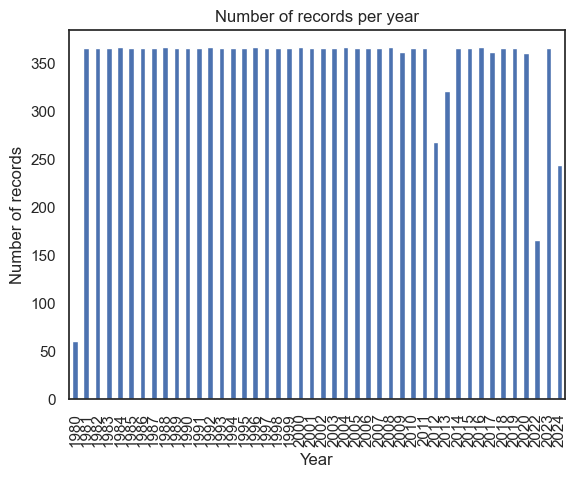

In [53]:
# plot of records per year:
data_per_year = df_river.groupby('year').size()

data_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [54]:
# how much data is missing in 1980, 2012, 2013 and 2022?
num_missing_records_1980 =  366 - df_river['year'][df_river['year']==1980].count()
num_missing_records_2012 =  366 - df_river['year'][df_river['year']==2012].count()
num_missing_records_2013 =  365 - df_river['year'][df_river['year']==2013].count()
num_missing_records_2022 =  365 - df_river['year'][df_river['year']==2022].count()
num_missing_records_2024 =  365 - df_river['year'][df_river['year']==2024].count()

print('Missing data for: 1980:', num_missing_records_1980, '2012:', num_missing_records_2012, '2013:', num_missing_records_2013, '2022:', num_missing_records_2022, '2024:', num_missing_records_2024)

Missing data for: 1980: 305 2012: 99 2013: 45 2022: 199 2024: 121


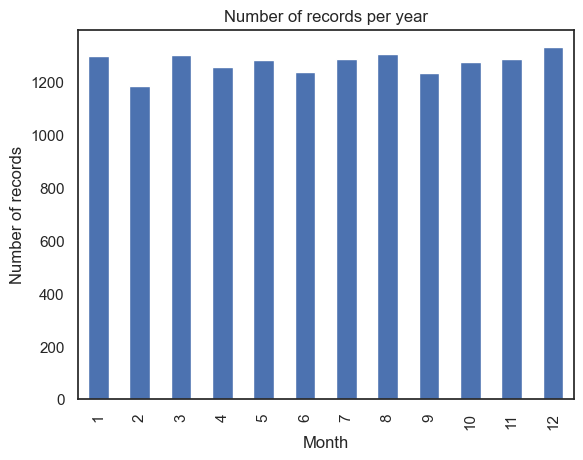

In [57]:
# plot of records per month:
data_per_month_river = df_river.groupby('month').size()

data_per_month_river.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Month')
plt.ylabel('Number of records')
plt.show()

In [58]:
df_river_suspended_nans = df_river[df_river['suspended_solids_concentration'].isna()]
df_river_suspended_nans

# no data of water quality from 19.07.2022 until 07.08.22 and after 21.08.24
# deleting all rows after 21.08.
# what shall I do with the data in 2022? Maybe fill them with the mean of 2 weeks before and 2 weeks after?
# looking into it:

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14513,2022-07-19,19.9,20.5,19.1,94,103,88,NaN,NaN,NaN,NaN,34.1,42.6,28.4,2022,7
14514,2022-07-20,20.4,21.4,19.6,99,107,93,NaN,NaN,NaN,NaN,39.1,47.3,32.6,2022,7
14515,2022-07-21,20.1,21.3,19.3,98,102,93,NaN,NaN,NaN,NaN,37.7,41.6,32.6,2022,7
14516,2022-07-22,19.6,20.5,18.8,92,95,87,NaN,NaN,NaN,NaN,32.0,34.4,27.7,2022,7
14517,2022-07-23,19.9,20.4,19.6,89,91,87,NaN,NaN,NaN,NaN,29.5,30.9,27.7,2022,7
14518,2022-07-24,19.8,20.7,19.1,89,94,87,NaN,NaN,NaN,NaN,29.7,33.5,27.7,2022,7
14519,2022-07-25,20.6,21.5,19.8,89,96,85,NaN,NaN,NaN,NaN,29.1,31.7,26.2,2022,7
14520,2022-07-26,20.3,21.3,19.8,100,109,92,NaN,NaN,NaN,NaN,39.7,49.8,31.7,2022,7
14521,2022-07-27,19.3,19.7,19.1,93,95,91,NaN,NaN,NaN,NaN,32.5,34.4,30.9,2022,7
14522,2022-07-28,19.1,20.2,18.4,93,99,90,NaN,NaN,NaN,NaN,32.9,38.3,30.0,2022,7


In [59]:
# looking over the means grouped by month to possibly fill in the NaNs of suspended solids concentration the monthly mean
df_river.groupby('month')['suspended_solids_concentration'].mean()


month
1     11.566006
2     13.412763
3     17.059093
4     15.863943
5     26.262615
6     35.792935
7     52.707526
8     34.954255
9     15.906783
10    13.360877
11    11.295578
12    11.554039
Name: suspended_solids_concentration, dtype: float64

In [60]:
# getting the mean of suspended concentration in the month July:
mean_concentration_july = df_river['suspended_solids_concentration'][df_river['month'] == 7].mean()
round(mean_concentration_july,2)

52.71

In [61]:
# getting the right part of the dataframe for the july NaNs:
df_river_suspended_nans_july = df_river[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==7)]
df_river_suspended_nans_july

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14513,2022-07-19,19.9,20.5,19.1,94,103,88,NaN,NaN,NaN,NaN,34.1,42.6,28.4,2022,7
14514,2022-07-20,20.4,21.4,19.6,99,107,93,NaN,NaN,NaN,NaN,39.1,47.3,32.6,2022,7
14515,2022-07-21,20.1,21.3,19.3,98,102,93,NaN,NaN,NaN,NaN,37.7,41.6,32.6,2022,7
14516,2022-07-22,19.6,20.5,18.8,92,95,87,NaN,NaN,NaN,NaN,32.0,34.4,27.7,2022,7
14517,2022-07-23,19.9,20.4,19.6,89,91,87,NaN,NaN,NaN,NaN,29.5,30.9,27.7,2022,7
14518,2022-07-24,19.8,20.7,19.1,89,94,87,NaN,NaN,NaN,NaN,29.7,33.5,27.7,2022,7
14519,2022-07-25,20.6,21.5,19.8,89,96,85,NaN,NaN,NaN,NaN,29.1,31.7,26.2,2022,7
14520,2022-07-26,20.3,21.3,19.8,100,109,92,NaN,NaN,NaN,NaN,39.7,49.8,31.7,2022,7
14521,2022-07-27,19.3,19.7,19.1,93,95,91,NaN,NaN,NaN,NaN,32.5,34.4,30.9,2022,7
14522,2022-07-28,19.1,20.2,18.4,93,99,90,NaN,NaN,NaN,NaN,32.9,38.3,30.0,2022,7


In [62]:
# fill in the July-NaNs with the mean:
df_river.loc[(df_river['suspended_solids_concentration'].isna()) & (df_river['month'] == 7), 'suspended_solids_concentration'] = round(mean_concentration_july,2)
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15271 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [63]:
# getting the mean of suspended concentration in the month august:
mean_concentration_august = df_river['suspended_solids_concentration'][df_river['month'] == 8].mean()
round(mean_concentration_august,2)

34.95

In [64]:
# getting the right part of the dataframe for the august NaNs:
df_river_suspended_nans_august = df_river[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==8)]
df_river_suspended_nans_august

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14526,2022-08-01,19.4,19.8,18.9,90,92,86,NaN,NaN,NaN,NaN,29.8,31.7,26.9,2022,8
14527,2022-08-02,20.0,20.7,19.5,91,93,89,NaN,NaN,NaN,NaN,30.9,32.6,29.2,2022,8
14528,2022-08-03,20.4,21.1,19.8,96,103,90,NaN,NaN,NaN,NaN,35.5,42.6,30.0,2022,8
14529,2022-08-04,20.7,21.5,19.7,98,103,93,NaN,NaN,NaN,NaN,31.8,36.0,27.8,2022,8
14530,2022-08-05,21.1,21.5,20.5,93,96,90,NaN,NaN,NaN,NaN,27.9,30.3,25.5,2022,8
14531,2022-08-06,20.4,21.2,19.4,89,97,86,NaN,NaN,NaN,NaN,24.7,30.3,22.8,2022,8
14532,2022-08-07,19.0,19.4,18.6,87,89,85,NaN,NaN,NaN,NaN,23.4,24.8,22.8,2022,8
15278,2024-08-22,17.6,18.4,16.7,131,136,125,NaN,NaN,NaN,NaN,68.0,75.2,58.8,2024,8
15279,2024-08-23,18.0,19.1,16.9,127,130,121,NaN,NaN,NaN,NaN,61.8,66.2,53.0,2024,8
15280,2024-08-24,18.8,20.0,17.6,126,131,120,NaN,NaN,NaN,NaN,60.5,67.7,51.6,2024,8


In [65]:
# fill in the august-NaNs with the mean:
df_river.loc[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==8), 'suspended_solids_concentration'] = round(mean_concentration_august,2)
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15288 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [66]:
df_river.tail(10)

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
15278,2024-08-22,17.6,18.4,16.7,131,136,125,34.95,NaN,NaN,NaN,68.0,75.2,58.8,2024,8
15279,2024-08-23,18.0,19.1,16.9,127,130,121,34.95,NaN,NaN,NaN,61.8,66.2,53.0,2024,8
15280,2024-08-24,18.8,20.0,17.6,126,131,120,34.95,NaN,NaN,NaN,60.5,67.7,51.6,2024,8
15281,2024-08-25,18.3,19.7,17.5,121,144,111,34.95,NaN,NaN,NaN,52.7,87.5,39.7,2024,8
15282,2024-08-26,16.4,17.4,16.1,142,150,131,34.95,NaN,NaN,NaN,84.2,96.9,67.7,2024,8
15283,2024-08-27,16.6,17.6,15.8,130,137,121,34.95,NaN,NaN,NaN,66.0,76.7,53.0,2024,8
15284,2024-08-28,17.8,19.0,16.6,117,121,113,34.95,NaN,NaN,NaN,47.5,53.0,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,34.95,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,34.95,NaN,NaN,NaN,43.5,46.1,36.3,2024,8
15287,2024-08-31,19.1,19.7,18.2,109,115,104,34.95,NaN,NaN,NaN,37.7,44.8,32.0,2024,8


In [67]:
df_river.shape

(15288, 16)

In [68]:
df_river_raw= df_river.copy()

## WEATHER:

In [69]:
# WEATHER:
# Loading the xls-files into DataFrames (first: 2011-06-01 to 2016, second: 2017 to 2024-09-05)
path_weather_2017_to_now = "../datasets/weather/weather20170102-20240905.xlsx"
path_weather_jun2011_to_2016 = "../datasets/weather/weather20110601-20161231.xlsx"

df_weather_jun2011_to_2016 = pd.read_excel(path_weather_jun2011_to_2016)
df_weather_2017_to_now = pd.read_excel(path_weather_2017_to_now)


In [70]:
# dataframe 2011 - 2016:
df_weather_jun2011_to_2016

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480
...,...,...,...,...,...,...,...,...,...,...,...
2036,2016-12-27,2.7,0.8,4.2,0.0,NaN,274.0,17.3,47.9,1040.5,90
2037,2016-12-28,2.9,-1.4,5.0,0.0,NaN,272.0,10.8,34.9,1043.3,108
2038,2016-12-29,0.7,-2.4,5.8,0.0,NaN,104.0,7.2,24.5,1041.1,402
2039,2016-12-30,-3.6,-5.3,-1.1,0.0,NaN,322.0,5.0,13.7,1040.2,336


In [71]:
# dataframe 2017 - now:
df_weather_2017_to_now

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2017-01-02,-2.4,-5.4,0.8,3.2,NaN,279.0,10.4,33.5,1022.7,18.0
1,2017-01-03,-0.9,-2.1,0.6,0.0,40.0,257.0,11.2,37.1,1026.7,216.0
2,2017-01-04,0.4,-0.9,1.3,2.2,30.0,260.0,26.6,73.1,1016.0,0.0
3,2017-01-05,-3.3,-7.1,-0.2,0.0,50.0,318.0,15.1,63.7,1025.9,0.0
4,2017-01-06,-9.3,-13.0,-6.5,0.0,50.0,25.0,5.8,19.4,1040.9,300.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
# checking if they were loades completely:
print("rows for 2011 until 2016:", df_weather_jun2011_to_2016.shape[0])
print("rows for 2017 until now:", df_weather_2017_to_now.shape[0])

rows for 2011 until 2016: 2041
rows for 2017 until now: 2804


In [73]:
#one dataframe with all the data of the weather:
df_weather = pd.concat([df_weather_jun2011_to_2016, df_weather_2017_to_now])
df_weather.head()

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0


In [74]:
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
df_weather.columns

Index(['date', 'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt',
       'pres', 'tsun'],
      dtype='object')

In [76]:
# How much NaNs do we have?
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       5
snow    2749
wdir     192
wspd      57
wpgt      59
pres       4
tsun       2
dtype: int64

In [77]:
# changing date into a dateformat:
df_weather['datenew'] = pd.to_datetime(df_weather['date'])
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,datenew
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0,2011-06-01
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0,2011-06-02
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0,2011-06-03
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0,2011-06-04
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0,2011-06-05
...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0,2024-09-01
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0,2024-09-02
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0,2024-09-03
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-04


In [78]:
# putting datenew on the first position:
cols_weather = df_weather.columns.to_list()
cols_weather.insert(0, cols_weather.pop(cols_weather.index('datenew')))
df_weather = df_weather[cols_weather]
df_weather


,datenew,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
# dropping 'date'
df_weather = df_weather.drop(columns='date')

In [80]:
# renaming datenew into date
df_weather = df_weather.rename(columns={'datenew':'date'})
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
# NaNs in windspeed and tmax and wpgt: I will do the same as for the missing values in the water dataframe. filling it with the means of the month. So first I have to add the columns year and month:
# adding columns year and month:
df_weather['year'] = df_weather['date'].dt.year
df_weather['month'] = df_weather['date'].dt.month
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    2096 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4788 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


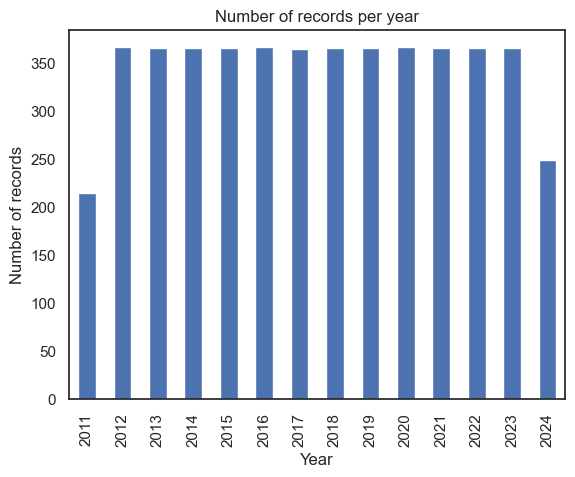

In [82]:
# plot of records per year:
data_per_year_weather = df_weather.groupby('year').size()

data_per_year_weather.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()

In [83]:
missing_records = {}
# For-Schleife für die Jahre 2011 bis 2024
for year in range(2011, 2024):
    # Bestimme, ob das Jahr ein Schaltjahr ist
    days_in_year = 366 if year % 4 == 0 else 365
    
    # Berechne die Anzahl der fehlenden Datensätze für das jeweilige Jahr
    num_missing_records = days_in_year - df_weather['year'][df_weather['year'] == year].count()
    
    # Speichere die fehlenden Datensätze im Dictionary
    missing_records[year] = num_missing_records

# Ausgabe der fehlenden Datensätze
print(missing_records)

{2011: 151, 2012: 0, 2013: 0, 2014: 0, 2015: 0, 2016: 0, 2017: 1, 2018: 0, 2019: 0, 2020: 0, 2021: 0, 2022: 0, 2023: 0}


In [84]:
# es fehlt nur ein Datensatz in 2017. I will leave it by that.

In [85]:
# NaNs snow: I will fill in for everry missing value a '0', because it is obvious, that it isn't documented in summer
df_weather['snow'] = df_weather['snow'].fillna(0)
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
0,2011-06-01,11.5,9.7,13.3,4.2,0.0,288.0,14.0,44.6,1021.7,0.0,2011,6
1,2011-06-02,13.4,10.9,17.1,0.0,0.0,42.0,10.8,32.8,1026.9,6.0,2011,6
2,2011-06-03,18.0,12.8,23.8,0.0,0.0,77.0,15.1,43.6,1022.9,378.0,2011,6
3,2011-06-04,20.6,14.6,27.8,0.0,0.0,80.0,12.2,31.3,1013.7,570.0,2011,6
4,2011-06-05,19.8,13.9,27.1,4.7,0.0,269.0,9.7,67.7,1007.7,480.0,2011,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,0.0,65.0,7.2,22.0,1013.9,564.0,2024,9
2800,2024-09-02,22.0,18.4,27.2,0.0,0.0,328.0,7.6,30.2,1012.8,493.0,2024,9
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0,2024,9
2802,2024-09-04,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,2024,9


In [86]:
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       5
snow       0
wdir     192
wspd      57
wpgt      59
pres       4
tsun       2
year       0
month      0
dtype: int64

In [87]:
# tmax is only in September 2024, so I leave it (because I will cut it off)
# then look into wspd
df_weather_wspd_nans = df_weather[df_weather['wspd'].isna()]
df_weather_wspd_nans

# no data of wspd in Dez, Jan, Feb and Sept
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
927,2013-12-14,0.9,-4.1,7.3,2.3,0.0,NaN,NaN,46.4,1030.9,306.0,2013,12
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,NaN,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,NaN,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,NaN,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,NaN,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,NaN,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,NaN,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,NaN,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,NaN,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,NaN,NaN,1026.1,0.0,2015,1


In [88]:
# looking over the means grouped by month to possibly fill in the NaNs of wspd the monthly mean
df_weather.groupby('month')['wspd'].mean()


month
1     11.504852
2     11.704310
3     11.221092
4     10.548974
5     10.032754
6      9.601429
7      9.421429
8      8.710369
9      8.426410
10     8.732506
11     9.210000
12    10.619900
Name: wspd, dtype: float64

In [89]:
# getting the mean of wspd in the month January:
mean_wspd_jan = df_weather['wspd'][df_weather['month'] == 1].mean()
round(mean_wspd_jan,2)


11.5

In [90]:
# getting the right part of the dataframe for the july NaNs:
df_weather_wspd_nans_jan = df_weather[(df_weather['wspd'].isna()) & (df_weather['month']==1)]
df_weather_wspd_nans_jan

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,NaN,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,NaN,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,NaN,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,NaN,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,NaN,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,NaN,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,NaN,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,NaN,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,NaN,NaN,1026.1,0.0,2015,1
1319,2015-01-10,13.6,10.5,16.3,6.2,0.0,NaN,NaN,NaN,1016.1,342.0,2015,1


In [91]:
# fill in the July-NaNs with the mean:
df_weather.loc[(df_weather['wspd'].isna()) & (df_weather['month'] == 1), 'wspd'] = round(mean_wspd_jan,2)
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4819 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [92]:
def fillna_mean_month(col, month):

    # getting the mean of wspd in the month January:
    mean_variable_month = df_weather[col][df_weather['month'] == month].mean()
    mean_varibale_month = round(mean_variable_month,2)

    df_weather.loc[(df_weather[col].isna()) & (df_weather['month'] == month), col] = round(mean_variable_month,2)
    df_weather.info()

In [93]:
fillna_mean_month('wspd',9)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4824 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [94]:
fillna_mean_month('wspd',2)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4844 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [95]:
fillna_mean_month('wspd',12)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [96]:
# looking over the means grouped by month to possibly fill in the NaNs of wspd the monthly mean
df_weather.groupby('month')['wpgt'].mean()

month
1     37.428571
2     38.334483
3     37.491067
4     36.617436
5     36.278055
6     36.292143
7     36.726959
8     34.092379
9     29.828462
10    30.134491
11    30.587179
12    35.424566
Name: wpgt, dtype: float64

In [97]:
# looking into wpgt
df_weather_wpgt_nans = df_weather[df_weather['wpgt'].isna()]
df_weather_wpgt_nans

# no data of wpgt in may, jan, feb, sept, august
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
1084,2014-05-20,18.0,9.4,25.7,0.0,0.0,131.0,7.90,NaN,1012.3,756.0,2014,5
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,11.50,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,11.50,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,11.50,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,11.50,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,11.50,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,11.50,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,11.50,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,11.50,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,11.50,NaN,1026.1,0.0,2015,1


In [98]:
# filling the missing data in january with the all over mean of january
fillna_mean_month('wpgt',1)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4817 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [99]:
# filling the missing data in february with the all over mean of january
fillna_mean_month('wpgt',2)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4837 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [100]:
# filling the missing data in may with the all over mean of may
fillna_mean_month('wpgt',5)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4839 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [101]:
# filling the missing data in sept with the all over mean of september
fillna_mean_month('wpgt',9)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4844 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [102]:
# filling the missing data in august with the all over mean of august
fillna_mean_month('wpgt',8)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [103]:
# then look into prcp
df_weather_prcp_nans = df_weather[df_weather['prcp'].isna()]
df_weather_prcp_nans

# no data of prcp in april (September I will delete)
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
455,2018-04-02,9.5,1.9,16.5,NaN,0.0,178.0,9.00,25.20,1011.2,600.0,2018,4
456,2018-04-03,15.9,10.0,22.6,NaN,0.0,178.0,9.70,45.40,1005.8,480.0,2018,4
457,2018-04-04,15.4,8.8,23.3,NaN,0.0,199.0,12.60,65.20,1005.2,576.0,2018,4
2802,2024-09-04,NaN,NaN,NaN,NaN,0.0,NaN,8.43,29.83,NaN,NaN,2024,9
2803,2024-09-05,NaN,NaN,NaN,NaN,0.0,NaN,8.43,29.83,NaN,NaN,2024,9


In [104]:
# filling the missing data in april with the all over mean of april
fillna_mean_month('prcp',4)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4843 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [105]:
df_weather.shape

(4845, 13)

In [106]:
df_river.shape

(15288, 16)

In [107]:
# copy of weather data:
df_weather_raw = df_weather.copy()

## Step 3: deeper look into the data
### a. river:
- standard numbers
- eventually some visualizations to get a clearer view
- profile in pandas

In [108]:
# looking into the datatypes
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15288 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [109]:
df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.30,47.9,63.4,37.0,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.10,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60.0,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.60,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47.0,1980,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,16.6,17.6,15.8,130,137,121,34.95,NaN,NaN,NaN,66.0,76.7,53.0,2024,8
15284,2024-08-28,17.8,19.0,16.6,117,121,113,34.95,NaN,NaN,NaN,47.5,53.0,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,34.95,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,34.95,NaN,NaN,NaN,43.5,46.1,36.3,2024,8


In [110]:
df_river.describe().T

,count,mean,min,25%,50%,75%,max,std
date,15288,2001-12-09 16:02:21.287284224,1980-11-01 00:00:00,1991-04-19 18:00:00,2001-10-05 12:00:00,2012-03-27 06:00:00,2024-08-31 00:00:00,NaN
avg_water_temperature,15288.0,9.912055,0.2,5.5,9.6,14.1,21.8,4.830674
max_water_temperature,15288.0,10.198947,0.5,5.7,9.9,14.3,22.4,4.955
min_water_temperature,15288.0,9.631279,-0.1,5.3,9.3,13.8,21.4,4.732989
avg_water_level,15288.0,84.137232,19.0,59.0,78.0,99.0,495.0,35.951824
max_water_level,15288.0,93.129579,25.0,68.0,86.0,108.0,542.0,39.541371
min_water_level,15288.0,75.599359,11.0,52.0,70.0,91.0,451.0,33.177899
suspended_solids_concentration,15288.0,21.659735,1.05,6.66,10.82,17.75,2000.97,74.59221
suspended_solid_load,15258.0,231.565058,1.49,21.4525,43.35,98.615,50194.83,1305.091107
suspended_sediment_erosion,15258.0,0.082023,0.0,0.01,0.02,0.04,17.68,0.459831


In [111]:
# creating a report, automatically in an html-file:
# profile_report_river = df_river.profile_report()
# profile_report_river.to_file(output_file='output_river_level.html')

In [112]:
#profile_report_river

## Step 3: deeper look into the data
### b. weather:
- standard numbers
- eventually some visualizations to get a clearer view
- profile in pandas

In [113]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4843 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [114]:
df_weather.describe().T

,count,mean,min,25%,50%,75%,max,std
date,4845,2018-01-17 13:53:23.219814144,2011-06-01 00:00:00,2014-09-24 00:00:00,2018-01-18 00:00:00,2021-05-13 00:00:00,2024-09-05 00:00:00,NaN
tavg,4843.0,10.959529,-12.6,4.9,10.9,17.1,29.5,7.643796
tmin,4843.0,6.705245,-16.6,1.4,6.7,12.2,21.5,6.633847
tmax,4843.0,15.640058,-9.7,8.6,15.6,22.9,36.9,9.034461
prcp,4843.0,2.631505,0.0,0.0,0.0,2.5,91.5,5.945939
snow,4845.0,4.945304,0.0,0.0,0.0,0.0,420.0,24.262493
wdir,4653.0,197.098431,0.0,100.0,233.0,265.0,359.0,92.313677
wspd,4845.0,9.955102,0.7,7.2,9.0,11.5,36.7,4.202105
wpgt,4845.0,34.937653,9.4,24.1,31.7,42.1,119.9,14.691284
pres,4841.0,1016.882813,980.0,1012.1,1016.8,1021.7,1044.9,8.139639


In [115]:
# creating a report, automatically in an html-file:
#profile_report_weather = df_weather.profile_report()
#profile_report_weather.to_file(output_file='output_weather.html')

In [116]:
#profile_report_weather

 ## Step 4: Data cleaning

## 4.1 Nans


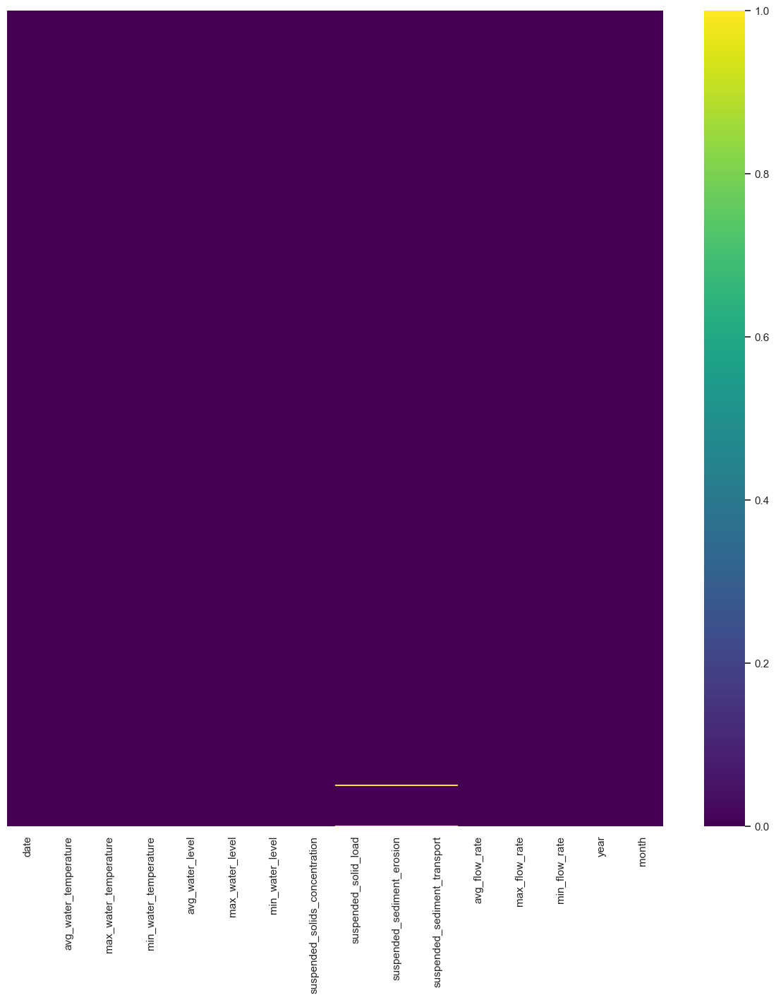

In [117]:
# Heatmap of the nans river
sns.set(rc={'figure.figsize':(15, 15)})
sns.heatmap(df_river.isnull(), yticklabels=False, cbar=True, cmap='viridis')

plt.show()

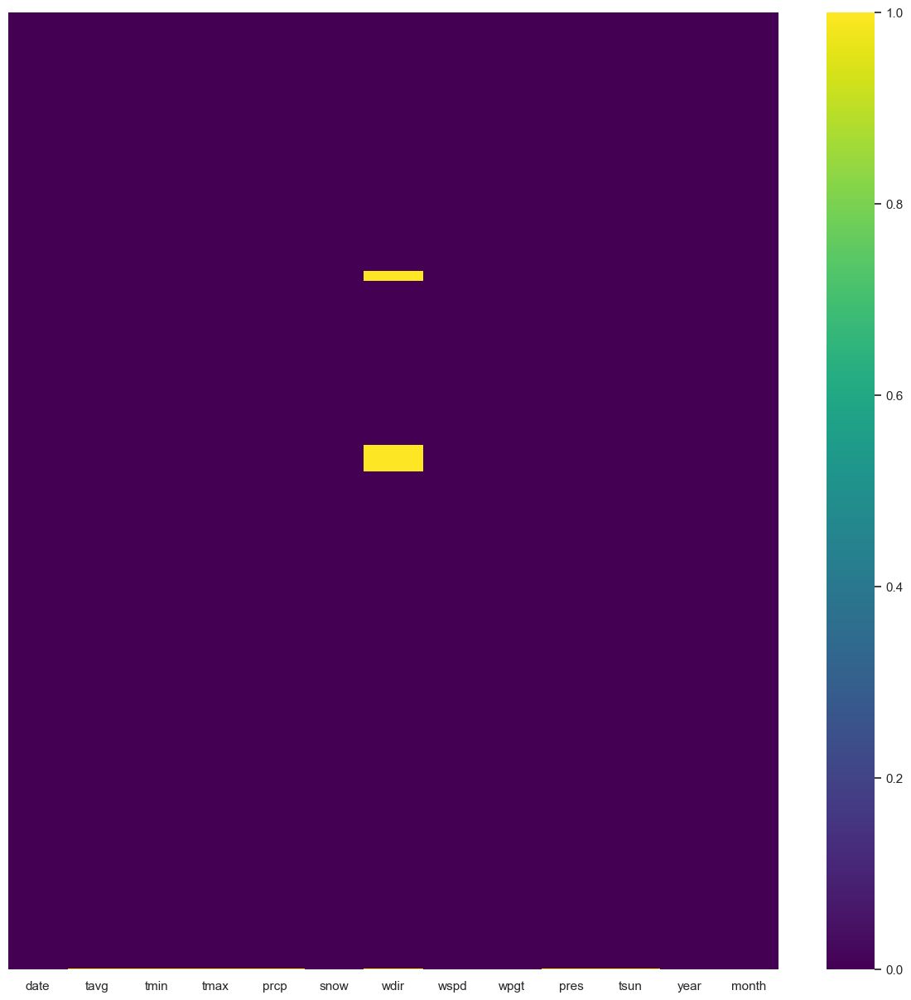

In [118]:
# Heatmap of the nans river
sns.set(rc={'figure.figsize':(15, 15)})
sns.heatmap(df_weather.isnull(), yticklabels=False, cbar=True, cmap='viridis')

plt.show()

In [119]:
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       2
snow       0
wdir     192
wspd       0
wpgt       0
pres       4
tsun       2
year       0
month      0
dtype: int64

## 4.2 dropping duplicates

In [120]:
# check the number of rows before dropping duplicates RIVER
df_river.shape

(15288, 16)

In [121]:
# drop duplicates RIVER
df_river_duplicates= df_river.drop_duplicates()
df_river_duplicates.shape

(15288, 16)

In [122]:
# check the number of rows before dropping duplicates WEATHER
df_weather.shape

(4845, 13)

In [123]:
df_weather_duplicates = df_weather.drop_duplicates()
df_weather_duplicates.shape

(4845, 13)

In [124]:
### NO DUPLICATES AT ALL

## 4.3 managing outliers

In [125]:
df_river.head(10)

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.30,47.9,63.4,37.0,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.10,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60.0,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.60,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47.0,1980,11
5,1980-11-06,4.7,4.7,4.7,75,82,64,5.59,22.19,0.01,0.26,51.4,58.8,41.3,1980,11
6,1980-11-07,6.1,6.1,6.1,62,72,44,4.58,16.04,0.01,0.19,39.4,48.8,24.8,1980,11
7,1980-11-08,7.7,7.7,7.7,56,65,43,11.34,40.00,0.01,0.46,34.5,42.2,24.0,1980,11
8,1980-11-09,7.5,7.5,7.5,55,64,43,13.53,42.45,0.02,0.49,33.3,41.2,24.0,1980,11
9,1980-11-10,7.6,7.6,7.6,48,60,40,15.29,42.92,0.02,0.50,27.8,37.6,21.8,1980,11


In [126]:
df_weather.head(10)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
0,2011-06-01,11.5,9.7,13.3,4.2,0.0,288.0,14.0,44.6,1021.7,0.0,2011,6
1,2011-06-02,13.4,10.9,17.1,0.0,0.0,42.0,10.8,32.8,1026.9,6.0,2011,6
2,2011-06-03,18.0,12.8,23.8,0.0,0.0,77.0,15.1,43.6,1022.9,378.0,2011,6
3,2011-06-04,20.6,14.6,27.8,0.0,0.0,80.0,12.2,31.3,1013.7,570.0,2011,6
4,2011-06-05,19.8,13.9,27.1,4.7,0.0,269.0,9.7,67.7,1007.7,480.0,2011,6
5,2011-06-06,16.9,12.7,24.6,13.1,0.0,244.0,8.6,55.1,1005.6,264.0,2011,6
6,2011-06-07,19.4,12.1,25.2,0.0,0.0,121.0,9.0,34.9,1004.3,624.0,2011,6
7,2011-06-08,15.5,12.5,19.3,1.9,0.0,261.0,12.6,51.5,1006.3,18.0,2011,6
8,2011-06-09,13.7,12.3,15.4,0.4,0.0,310.0,7.6,19.8,1014.9,0.0,2011,6
9,2011-06-10,14.4,10.9,18.6,0.0,0.0,329.0,6.8,21.2,1015.5,150.0,2011,6


In [261]:
# don't have to differate in categorical and numerical, because there are only numerical variables
# RIVER:
#for col in df_river:
#  OutLiersBox(df_river, col)

In [263]:
# looking deeper into the outliers water_level, suspendeds_solids-concentration, flow_rate
Q1 = df_river['avg_water_level'].quantile(.25)
Q3 = df_river['avg_water_level'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("water_level (avg): ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_avg_water_level = df_river[(df_river['avg_water_level']) > upper_limit]
num_outliers_avg_water_level.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 563 rows -> a lot! in 43 years

water_level (avg):  40.0 lower limit=  -1.0 upper_limit=  159.0


563

In [276]:
df_river['year'][df_river['avg_water_level']>159.0].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [271]:
# looking deeper into the outliers suspendeds_solids-concentration, flow_rate
Q1 = df_river['suspended_solids_concentration'].quantile(.25)
Q3 = df_river['suspended_solids_concentration'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("'suspended_solids_concentration': ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_sus_solids_concentration = df_river[(df_river['suspended_solids_concentration']) > upper_limit]
num_outliers_sus_solids_concentration.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 1390 rows -> a lot, in 43 years

'suspended_solids_concentration':  11.09 lower limit=  -9.974999999999998 upper_limit=  34.385


1390

In [278]:
df_river['year'][df_river['suspended_solids_concentration']>34.385].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [293]:
df_river['date'][df_river['suspended_solids_concentration']>34.385] == df_river['date'][df_river['avg_water_level']>159.0]

ValueError: Can only compare identically-labeled Series objects

In [280]:
# looking deeper into the outliers of flow_rate
Q1 = df_river['avg_flow_rate'].quantile(.25)
Q3 = df_river['avg_flow_rate'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("'avg_flow_rate': ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_avg_flow_rate = df_river[(df_river['avg_flow_rate']) > upper_limit]
num_outliers_avg_flow_rate.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 854 rows -> a lot! in 43 years

'avg_flow_rate':  43.9 lower limit=  -33.74999999999999 upper_limit=  141.85


854

In [288]:
df_river['year'][df_river['avg_flow_rate']>141.85].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [290]:
df_river['year'][df_river['avg_flow_rate']>141.85].unique() == df_river['year'][df_river['suspended_solids_concentration']>34.385].unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [128]:
# WEATHER:
#for col in df_weather:
   # OutLiersBox(df_weather, col)

# Creating the final dataframe

columns for swimming: 
- `max water temperature`
- `avg water level`
- `suspended solids concentration`
- `max flow rate`
- `max temperature`
- `total precipitation`
- `avg windspeed`
- `peak gust`

additional columns for ice-bath:
- `snow_depth`


## 1. river
- max water temperature: > 18 °C*
- avg water level: < 120 cm
- suspended solids concentration < 25 m3/s
- max flow rate: < 75 m3/s*


In [130]:
df_river_final = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration', 'max_flow_rate']]
df_river_final

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,1980-11-01,8.1,71,5.57,63.4
1,1980-11-02,7.3,59,5.10,39.6
2,1980-11-03,5.8,68,5.14,60.0
3,1980-11-04,5.6,77,7.60,56.9
4,1980-11-05,4.8,77,9.03,66.5
...,...,...,...,...,...
15283,2024-08-27,17.6,130,34.95,76.7
15284,2024-08-28,19.0,117,34.95,53.0
15285,2024-08-29,19.6,114,34.95,46.1
15286,2024-08-30,19.8,114,34.95,46.1


In [132]:
df_river_final.tail(20)

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
15268,2024-08-12,21.3,108,487.95,43.5
15269,2024-08-13,21.4,113,487.97,48.8
15270,2024-08-14,21.0,118,487.96,54.5
15271,2024-08-15,20.8,134,487.95,87.5
15272,2024-08-16,20.6,117,487.95,60.3
15273,2024-08-17,20.3,115,487.97,53.0
15274,2024-08-18,20.2,117,487.88,67.7
15275,2024-08-19,18.6,167,487.77,167.0
15276,2024-08-20,17.3,165,487.72,155.0
15277,2024-08-21,18.0,143,481.78,95.4


In [133]:
df_river_final.isna().sum()

date                              0
max_water_temperature             0
avg_water_level                   0
suspended_solids_concentration    0
max_flow_rate                     0
dtype: int64

## 2. weather
- `max temperature`
- `total precipitation`
- `avg windspeed`
- `peak gust`

additional columns for ice-bath:
- `snow_depth`


In [142]:
# creating dataframe to observate the suitability to go swimming in the Isar, values of the weather:
#df_swimming_weather = 
cols_weather_drop = ['tavg', 
                     'tmin',
                     'wdir',
                     'pres', 
                     'tsun',
                     'year',
                     'month'
                    ]
cols_weather_drop
df_weather_final = df_weather.drop(columns=cols_weather_drop)
df_weather_final


,date,tmax,prcp,snow,wspd,wpgt
0,2011-06-01,13.3,4.2,0.0,14.00,44.60
1,2011-06-02,17.1,0.0,0.0,10.80,32.80
2,2011-06-03,23.8,0.0,0.0,15.10,43.60
3,2011-06-04,27.8,0.0,0.0,12.20,31.30
4,2011-06-05,27.1,4.7,0.0,9.70,67.70
...,...,...,...,...,...,...
2799,2024-09-01,29.5,0.0,0.0,7.20,22.00
2800,2024-09-02,27.2,0.0,0.0,7.60,30.20
2801,2024-09-03,28.9,0.0,0.0,5.40,18.70
2802,2024-09-04,NaN,NaN,0.0,8.43,29.83


In [143]:
df_weather_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tmax    4843 non-null   float64       
 2   prcp    4843 non-null   float64       
 3   snow    4845 non-null   float64       
 4   wspd    4845 non-null   float64       
 5   wpgt    4845 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 265.0 KB


In [144]:
df_weather_final.isna().sum()

date    0
tmax    2
prcp    2
snow    0
wspd    0
wpgt    0
dtype: int64

In [145]:
# rows in Septemeber 2024 I drop:
df_weather_final = df_swimming_weather[df_swimming_weather['date']<='2024-08-31']
df_weather_final

,date,tmax,prcp,snow,wspd,wpgt
0,2011-06-01,13.3,4.2,0.0,14.0,44.60
1,2011-06-02,17.1,0.0,0.0,10.8,32.80
2,2011-06-03,23.8,0.0,0.0,15.1,43.60
3,2011-06-04,27.8,0.0,0.0,12.2,31.30
4,2011-06-05,27.1,4.7,0.0,9.7,67.70
...,...,...,...,...,...,...
2794,2024-08-27,24.6,0.0,0.0,8.6,31.70
2795,2024-08-28,29.6,0.0,0.0,5.0,34.09
2796,2024-08-29,31.2,0.0,0.0,6.1,23.80
2797,2024-08-30,30.8,0.0,0.0,6.1,24.50


In [146]:
df_weather_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4840 entries, 0 to 2798
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4840 non-null   datetime64[ns]
 1   tmax    4840 non-null   float64       
 2   prcp    4840 non-null   float64       
 3   snow    4840 non-null   float64       
 4   wspd    4840 non-null   float64       
 5   wpgt    4840 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 264.7 KB


## 3. creating df_final

In [147]:
#joining swimming-water and swimming-weather to one dataframe 

df_final= pd.merge(df_weather_final, df_river_final, 
                       how='left', on='date')
df_final

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,2011-06-01,13.3,4.2,0.0,14.0,44.60,16.1,107.0,126.14,192.0
1,2011-06-02,17.1,0.0,0.0,10.8,32.80,13.2,82.0,114.69,98.7
2,2011-06-03,23.8,0.0,0.0,15.1,43.60,14.8,62.0,90.89,60.0
3,2011-06-04,27.8,0.0,0.0,12.2,31.30,16.4,52.0,67.09,42.4
4,2011-06-05,27.1,4.7,0.0,9.7,67.70,17.1,49.0,43.29,43.6
...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,0.0,8.6,31.70,17.6,130.0,34.95,76.7
4836,2024-08-28,29.6,0.0,0.0,5.0,34.09,19.0,117.0,34.95,53.0
4837,2024-08-29,31.2,0.0,0.0,6.1,23.80,19.6,114.0,34.95,46.1
4838,2024-08-30,30.8,0.0,0.0,6.1,24.50,19.8,114.0,34.95,46.1


In [148]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   snow                            4840 non-null   float64       
 4   wspd                            4840 non-null   float64       
 5   wpgt                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 378.2 KB


In [149]:
df_final.isna().sum()

date                                0
tmax                                0
prcp                                0
snow                                0
wspd                                0
wpgt                                0
max_water_temperature             718
avg_water_level                   718
suspended_solids_concentration    718
max_flow_rate                     718
dtype: int64

# 4. adding a variable "swimming" yes/no (1/0), "swimming_hardcore" yes/no (1/0) and "ice-bath" yes/no(1/0)

`swimming = 1, if...`
- `max water temperature: > 18 °C`
- `avg water level: > 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 75 m3/s`
- `max temperature: > 25 °C`
- `total precipitation < 30 mm/day`
- `avg windspeed <30km/h`
- `peak gust <50km/h`


In [180]:
def determine_swimming(row):
	if (row['max_water_temperature'] > 18.0) and \
		(row['avg_water_level'] < 120.0) and \
		(row['suspended_solids_concentration'] < 25.0) and \
		(row['max_flow_rate'] < 75.0) and \
		(row['tmax'] > 25.0) and \
		(row['prcp'] < 30.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0):
		return 1
	return 0

#Apply to each row
df_final['swimming']=df_final.apply(determine_swimming,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [181]:
df_final.swimming.value_counts()

swimming
0    4639
1     201
Name: count, dtype: int64

In [332]:
def determine_swimming_hardcore_new(row):
	if (row['max_water_temperature'] > 15.0) and \
		(row['avg_water_level'] < 160.0) and \
		(row['suspended_solids_concentration'] < 80.0) and \
		(row['max_flow_rate'] < 90.0) and \
		(row['tmax'] > 20.0) and \
		(row['prcp'] < 60.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0) and \
		(row['swimming'] == 0):
		return 1
	return 0

#Apply to each row
df_final['swimming_hardcore_new']=df_final.apply(determine_swimming_hardcore_new,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [333]:
df_final.swimming_hardcore_new.value_counts()

swimming_hardcore_new
0    4404
1     436
Name: count, dtype: int64

In [314]:
df_final['swimming_hardcore'].value_counts()

swimming_hardcore
0    4203
1     637
Name: count, dtype: int64

In [197]:
# creating a 2nd variable swimming_hardcore with other conditions
def determine_swimming_hardcore(row):
	if (row['max_water_temperature'] > 15.0) and \
		(row['avg_water_level'] < 160.0) and \
		(row['suspended_solids_concentration'] < 80.0) and \
		(row['max_flow_rate'] < 90.0) and \
		(row['tmax'] > 20.0) and \
		(row['prcp'] < 60.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0):
		return 1
	return 0

#Apply to each row
df_final['swimming_hardcore']=df_final.apply(determine_swimming_hardcore,axis=1)

In [315]:
df_final.swimming_hardcore.value_counts()

swimming_hardcore
0    4203
1     637
Name: count, dtype: int64

In [329]:
# creating a 3rd variable "ice_bath":

def determine_ice_bath(row):
	if (row['max_water_temperature'] < 11.0) and \
		(row['avg_water_level'] < 120.0) and \
		(row['suspended_solids_concentration'] < 25.0) and \
		(row['max_flow_rate'] < 65.0) and \
		(row['tmax'] > -10.0) and \
		(row['prcp'] < 15.0) and \
		(row['wspd'] < 11.0) and \
		(row['wpgt'] < 50.0) and \
		(row['snow'] < 30.0):
		return 1
	return 0

#Apply to each row
df_final['ice_bath']=df_final.apply(determine_ice_bath,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [330]:
df_final.ice_bath.value_counts()

ice_bath
0    4087
1     753
Name: count, dtype: int64

In [338]:
df_final = df_final.drop(columns=['swimming_harcore_new', 'swimming_harcore_new_new'])
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   snow                            4840 non-null   float64       
 4   wspd                            4840 non-null   float64       
 5   wpgt                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
 10  swimming                        4840 non-null   int64         
 11  swim

In [339]:
df_final.describe().T

,count,mean,min,25%,50%,75%,max,std
date,4840,2018-01-15 01:52:45.619834624,2011-06-01 00:00:00,2014-09-22 18:00:00,2018-01-15 12:00:00,2021-05-09 06:00:00,2024-08-31 00:00:00,NaN
tmax,4840.0,15.632066,-9.7,8.6,15.6,22.9,36.9,9.031521
prcp,4840.0,2.633136,0.0,0.0,0.0,2.5,91.5,5.947421
snow,4840.0,4.950413,0.0,0.0,0.0,0.0,420.0,24.274503
wspd,4840.0,9.957729,0.7,7.2,9.0,11.5,36.7,4.203328
wpgt,4840.0,34.946771,9.4,24.1,31.7,42.1,119.9,14.695314
max_water_temperature,4122.0,11.254755,0.5,6.5,11.0,15.8,21.9,5.104476
avg_water_level,4122.0,91.763464,27.0,67.0,87.0,108.0,339.0,36.047982
suspended_solids_concentration,4122.0,28.684668,1.39,5.1825,8.805,14.57,2000.97,128.84849
max_flow_rate,4122.0,72.761815,14.8,35.4,56.2,89.475,603.0,57.466374


In [190]:
df_final.head(20)

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate,swimming,swimming_hardcore,ice_bath
0,2011-06-01,13.3,4.2,0.0,14.0,44.6,16.1,107.0,126.14,192.0,0,0,0
1,2011-06-02,17.1,0.0,0.0,10.8,32.8,13.2,82.0,114.69,98.7,0,0,0
2,2011-06-03,23.8,0.0,0.0,15.1,43.6,14.8,62.0,90.89,60.0,0,0,0
3,2011-06-04,27.8,0.0,0.0,12.2,31.3,16.4,52.0,67.09,42.4,0,1,0
4,2011-06-05,27.1,4.7,0.0,9.7,67.7,17.1,49.0,43.29,43.6,0,0,0
5,2011-06-06,24.6,13.1,0.0,8.6,55.1,17.1,63.0,21.59,70.4,0,0,0
6,2011-06-07,25.2,0.0,0.0,9.0,34.9,16.7,56.0,16.26,45.5,0,1,0
7,2011-06-08,19.3,1.9,0.0,12.6,51.5,16.5,52.0,14.40,42.3,0,0,0
8,2011-06-09,15.4,0.4,0.0,7.6,19.8,14.9,52.0,12.55,45.2,0,0,0
9,2011-06-10,18.6,0.0,0.0,6.8,21.2,13.8,61.0,11.20,59.6,0,0,0


In [340]:
df_final.to_csv("data_isar.csv", sep=';', decimal=',', index=False)

In [370]:
df_final

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate,swimming,swimming_hardcore,ice_bath,swimming_hardcore_new
0,2011-06-01,13.3,4.2,0.0,14.0,44.60,16.1,107.0,126.14,192.0,0,0,0,0
1,2011-06-02,17.1,0.0,0.0,10.8,32.80,13.2,82.0,114.69,98.7,0,0,0,0
2,2011-06-03,23.8,0.0,0.0,15.1,43.60,14.8,62.0,90.89,60.0,0,0,0,0
3,2011-06-04,27.8,0.0,0.0,12.2,31.30,16.4,52.0,67.09,42.4,0,1,0,1
4,2011-06-05,27.1,4.7,0.0,9.7,67.70,17.1,49.0,43.29,43.6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,0.0,8.6,31.70,17.6,130.0,34.95,76.7,0,1,0,1
4836,2024-08-28,29.6,0.0,0.0,5.0,34.09,19.0,117.0,34.95,53.0,0,1,0,1
4837,2024-08-29,31.2,0.0,0.0,6.1,23.80,19.6,114.0,34.95,46.1,0,1,0,1
4838,2024-08-30,30.8,0.0,0.0,6.1,24.50,19.8,114.0,34.95,46.1,0,1,0,1


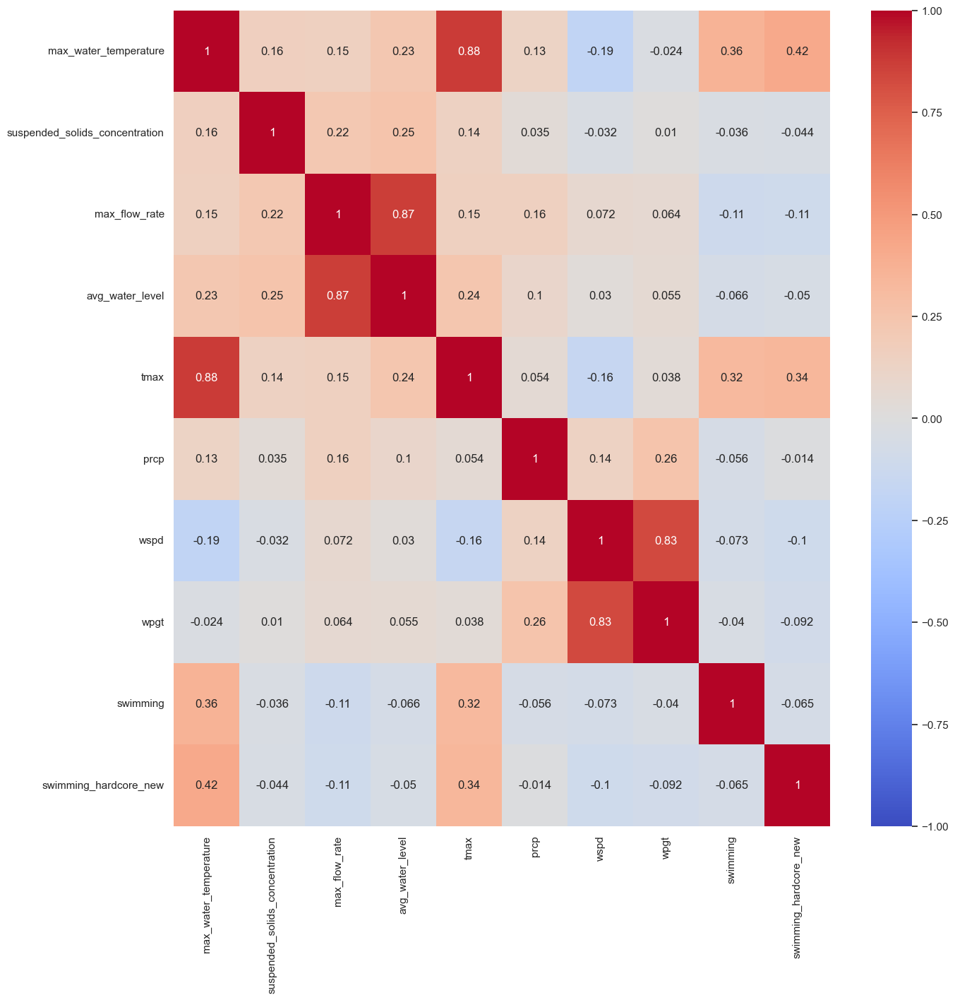

In [383]:
# heatmap with all the variables and swimming-variables:
df_final_heatmap_swimming = df_final[['max_water_temperature', 'suspended_solids_concentration', 'max_flow_rate','avg_water_level', 'tmax', 'prcp', 'wspd', 'wpgt','swimming', 'swimming_hardcore_new']]
# Berechne die Korrelationsmatrix
correlation_matrix = df_final_heatmap_swimming.corr()

# Erstelle die Heatmap
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

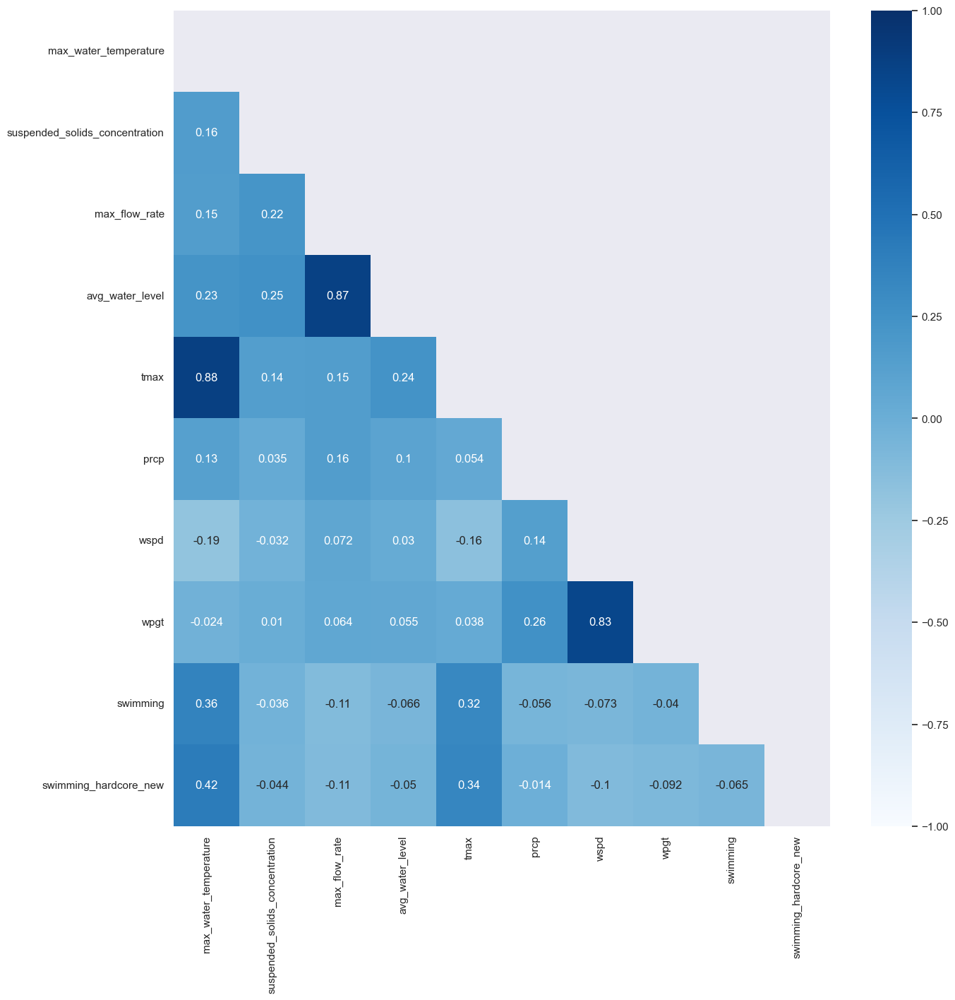

In [384]:
# Erstelle eine Maske für das obere Dreieck
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Erstelle die Heatmap mit der Maske
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap="Blues", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

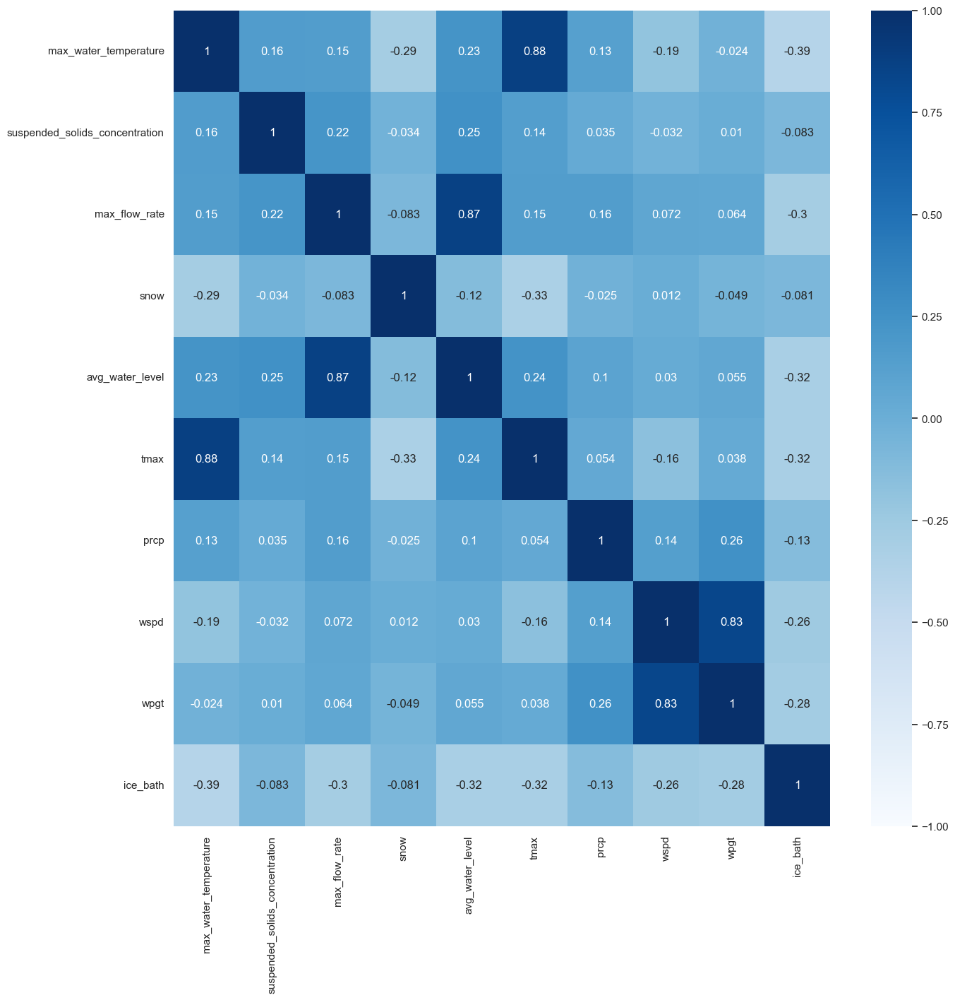

In [385]:
# heatmap with all the variables and ice-bath-variables:
df_final_heatmap_ice = df_final[['max_water_temperature', 'suspended_solids_concentration', 'max_flow_rate','snow','avg_water_level', 'tmax', 'prcp', 'wspd', 'wpgt','ice_bath']]
# Berechne die Korrelationsmatrix
correlation_matrix_ice = df_final_heatmap_ice.corr()

# Erstelle die Heatmap
sns.heatmap(correlation_matrix_ice, annot=True, cmap="Blues", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

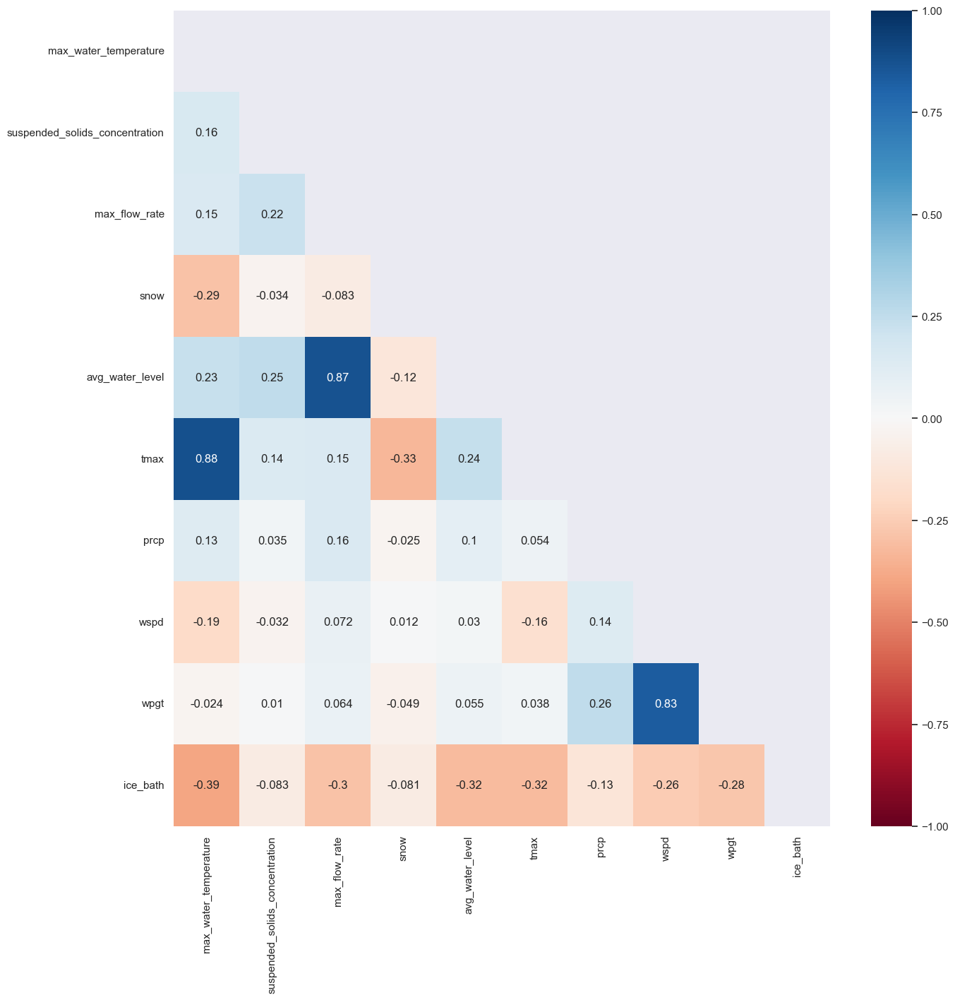

In [388]:
# Erstelle eine Maske für das obere Dreieck
mask = np.triu(np.ones_like(correlation_matrix_ice, dtype=bool))

# Erstelle die Heatmap mit der Maske
sns.heatmap(correlation_matrix_ice, mask=mask, annot=True, cmap="RdBu", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

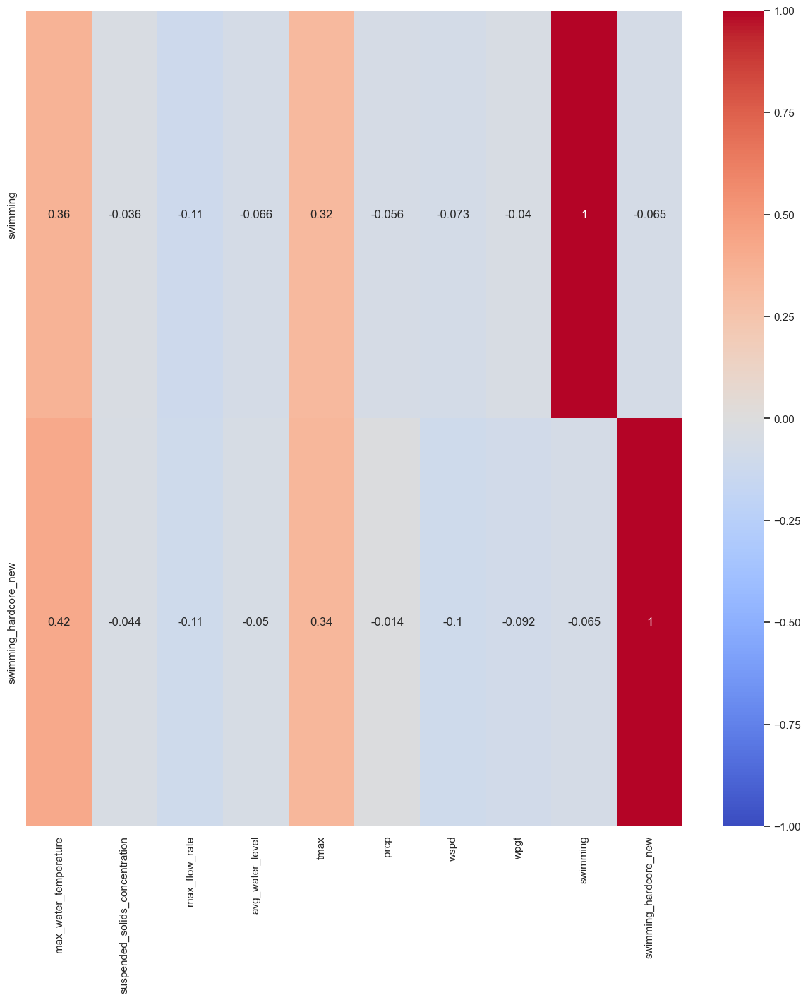

In [390]:
# Filtere die Korrelationen nur für die zwei Zielvariablen (Var1, Var2)
correlation_focus = correlation_matrix.loc[['swimming', 'swimming_hardcore_new'], :]

# Heatmap für die zwei Variablen erstellen
sns.heatmap(correlation_focus, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

plt.show()

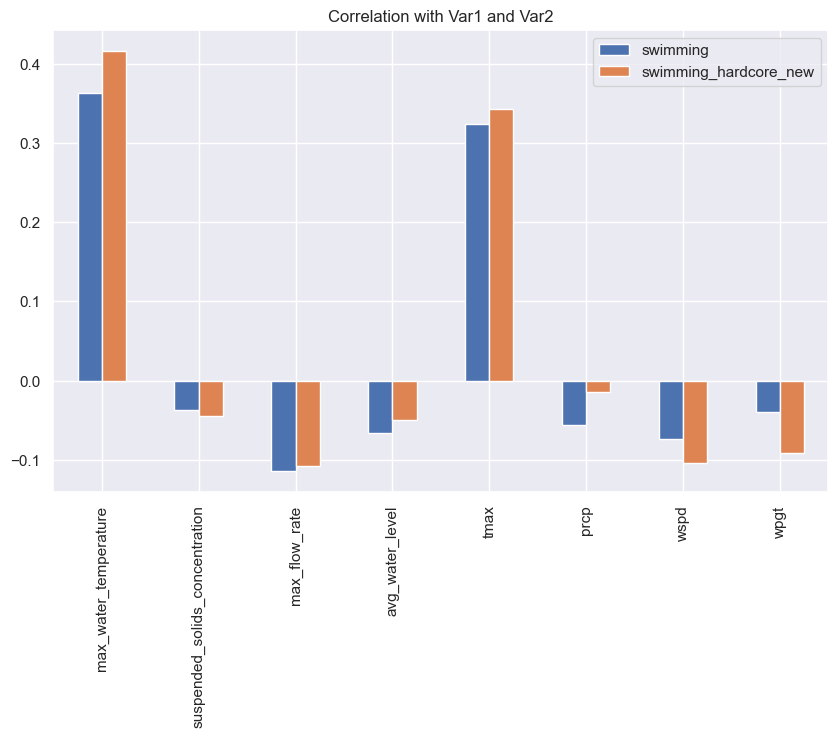

In [393]:
# Korrelationen berechnen
correlation_focus = correlation_matrix[['swimming', 'swimming_hardcore_new']].drop(['swimming', 'swimming_hardcore_new'])

# Balkendiagramm erstellen
correlation_focus.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation with Var1 and Var2')
plt.show()

AttributeError: 'AxesImage' object has no property 'mask'

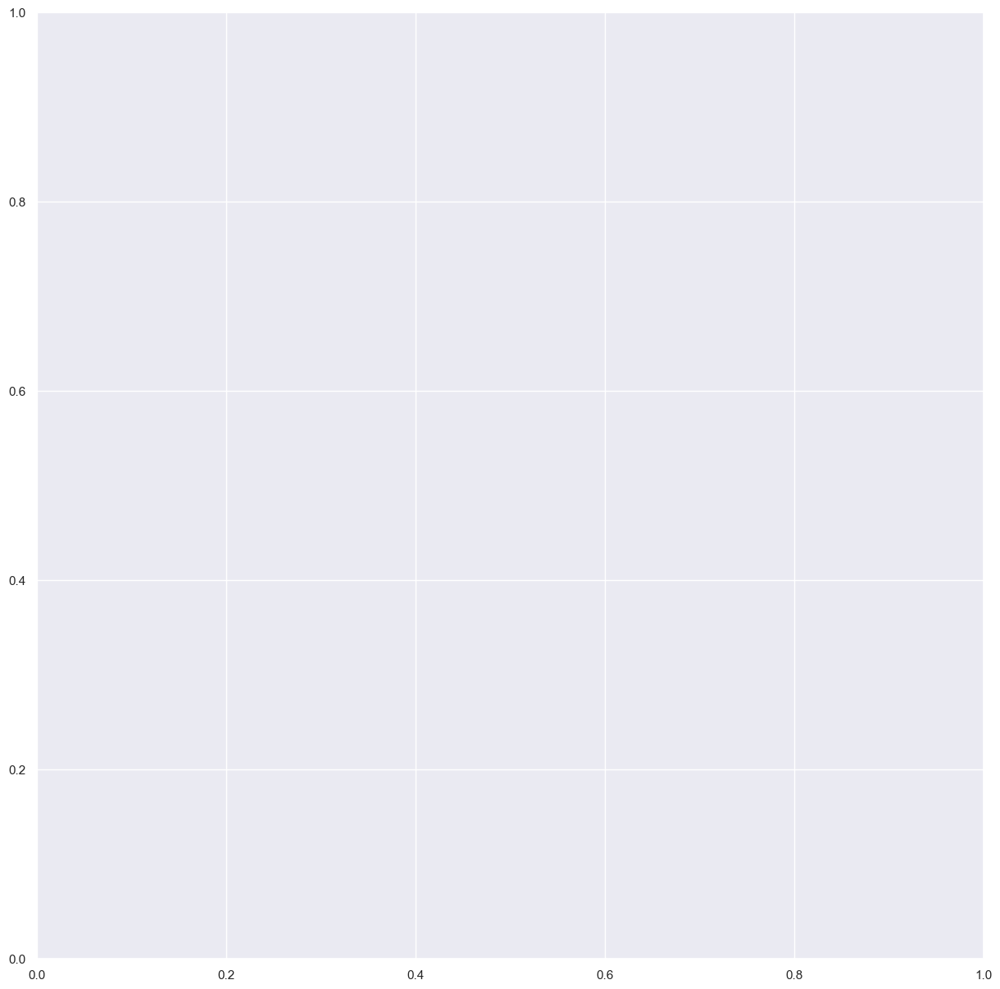

In [400]:
# Heatmap mit Matplotlib und benutzerdefinierten Anpassungen
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest', vmax=1, vmin=0)
plt.colorbar()
plt.title('Custom Heatmap')
plt.grid(which='major', color='black', linestyle='-', linewidth=1)
plt.show()

## Creating A DataFrame For Water Quality

In [242]:
df_water_quality

,Datum,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport
0,31.10.65,25,"47,85","0,02","0,55"
1,01.11.65,"18,06","32,47","0,01","0,38"
2,02.11.65,"11,57","20,55","0,01","0,24"
3,03.11.65,"11,11","27,77","0,01","0,32"
4,04.11.65,"9,88","26,54","0,01","0,31"
...,...,...,...,...,...
229,17.08.24,"487,97","1909,53","0,67","22,1"
230,18.08.24,"487,88","2010,8","0,71","23,27"
231,19.08.24,"487,77","5288,8","1,86","61,21"
232,20.08.24,"487,72","5090,98","1,79","58,92"


In [201]:
df_concentration = df_water_quality[['Datum','suspended_solids_concentration']]
df_concentration

,Datum,suspended_solids_concentration
0,31.10.65,25
1,01.11.65,"18,06"
2,02.11.65,"11,57"
3,03.11.65,"11,11"
4,04.11.65,"9,88"
...,...,...
229,17.08.24,"487,97"
230,18.08.24,"487,88"
231,19.08.24,"487,77"
232,20.08.24,"487,72"


In [204]:
# changing "Datum" into datetime for analyzing
df_concentration['date'] = pd.to_datetime(df_concentration['Datum'], dayfirst=True)
df_concentration

,Datum,suspended_solids_concentration,date
0,31.10.65,25,2065-10-31
1,01.11.65,"18,06",2065-11-01
2,02.11.65,"11,57",2065-11-02
3,03.11.65,"11,11",2065-11-03
4,04.11.65,"9,88",2065-11-04
...,...,...,...
229,17.08.24,"487,97",2024-08-17
230,18.08.24,"487,88",2024-08-18
231,19.08.24,"487,77",2024-08-19
232,20.08.24,"487,72",2024-08-20


In [ ]:
# there a data from 1900, which were interpretated as 2000. So have to manipulate the year
#df_concentration.loc[df_concentration['date'] >'2024-09-09', 'date'] = df_concentration['date'] - pd.DateOffset(years=100)
#df_concentration

In [206]:
# adding year, month into the dataframe
df_concentration['year']= df_concentration['date'].dt.year
df_concentration['month'] = df_concentration['date'].dt.month
df_concentration

,Datum,suspended_solids_concentration,date,year,month
0,31.10.65,25,2065-10-31,2065,10
1,01.11.65,"18,06",2065-11-01,2065,11
2,02.11.65,"11,57",2065-11-02,2065,11
3,03.11.65,"11,11",2065-11-03,2065,11
4,04.11.65,"9,88",2065-11-04,2065,11
...,...,...,...,...,...
229,17.08.24,"487,97",2024-08-17,2024,8
230,18.08.24,"487,88",2024-08-18,2024,8
231,19.08.24,"487,77",2024-08-19,2024,8
232,20.08.24,"487,72",2024-08-20,2024,8


In [210]:
# dropping "Datum"
df_concentration= df_concentration.drop(columns='Datum')
df_concentration

,suspended_solids_concentration,date,year,month
0,25,2065-10-31,2065,10
1,"18,06",2065-11-01,2065,11
2,"11,57",2065-11-02,2065,11
3,"11,11",2065-11-03,2065,11
4,"9,88",2065-11-04,2065,11
...,...,...,...,...
229,"487,97",2024-08-17,2024,8
230,"487,88",2024-08-18,2024,8
231,"487,77",2024-08-19,2024,8
232,"487,72",2024-08-20,2024,8


In [212]:
# replacing komma into dot
df_concentration['suspended_solids_concentration'] = df_concentration['suspended_solids_concentration'].str.replace(',', '.')
df_concentration

,suspended_solids_concentration,date,year,month
0,25,2065-10-31,2065,10
1,18.06,2065-11-01,2065,11
2,11.57,2065-11-02,2065,11
3,11.11,2065-11-03,2065,11
4,9.88,2065-11-04,2065,11
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


In [218]:
df_concentration_test = df_concentration[df_concentration['date']object.freq1000]
df_concentration

TypeError: Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`

In [213]:
#changing suspended_solids_concentration into a float
df_concentration['suspended_solids_concentration'] = df_concentration['suspended_solids_concentration'].astype(dtype='float64')
df_concentration


,suspended_solids_concentration,date,year,month
0,25.00,2065-10-31,2065,10
1,18.06,2065-11-01,2065,11
2,11.57,2065-11-02,2065,11
3,11.11,2065-11-03,2065,11
4,9.88,2065-11-04,2065,11
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


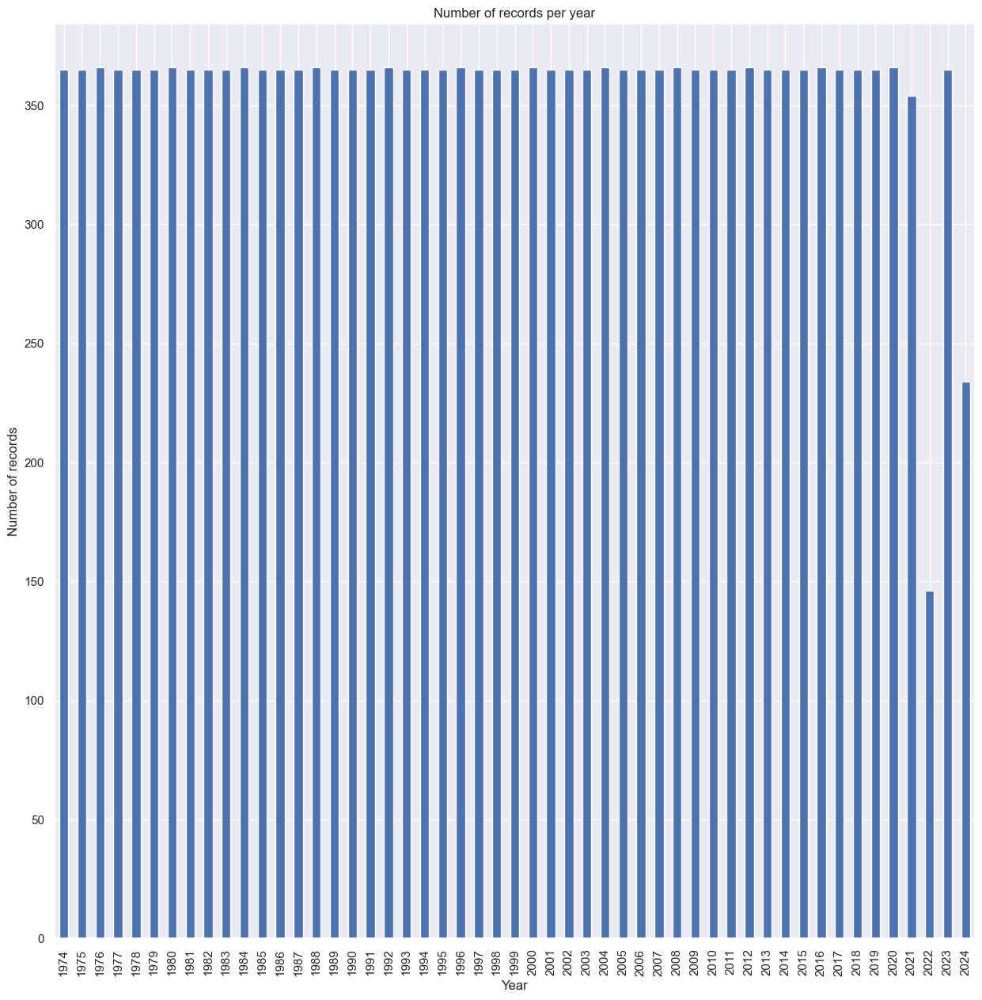

In [246]:
# plot of records per year to find out, if there's a lot of missing data
concentration_per_year = df_concentration.groupby('year').size()

concentration_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [217]:
df_concentration.year.unique()

array([2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2073, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021, 2022, 2023, 2024], dtype=int32)

In [229]:
duplicate_indices = df_concentration[df_concentration.index.duplicated()]
print(duplicate_indices)

     suspended_solids_concentration       date  year  month
0                              9.24 2024-01-01  2024      1
1                              9.23 2024-01-02  2024      1
2                              9.22 2024-01-03  2024      1
3                              9.15 2024-01-04  2024      1
4                              9.02 2024-01-05  2024      1
..                              ...        ...   ...    ...
229                          487.97 2024-08-17  2024      8
230                          487.88 2024-08-18  2024      8
231                          487.77 2024-08-19  2024      8
232                          487.72 2024-08-20  2024      8
233                          481.78 2024-08-21  2024      8

[234 rows x 4 columns]


In [244]:
df_concentration = df_concentration[df_concentration['year'] <= 2024]
df_concentration

,suspended_solids_concentration,date,year,month
2984,7.77,1974-01-01,1974,1
2985,8.38,1974-01-02,1974,1
2986,10.34,1974-01-03,1974,1
2987,16.67,1974-01-04,1974,1
2988,18.40,1974-01-05,1974,1
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


In [245]:
# there a data from 1900, which were interpretated as 2000. So have to manipulate the year
#df_concentration.loc[df_concentration['date'] >'2024-09-09', 'date'] = df_concentration['date'] - pd.DateOffset(years=100)
#df_concentration

In [247]:
# exporting the quality data
df_concentration.to_csv("data_quality.csv", sep=';', decimal=',', index=False)

## Creating A DataFrame For Water Level

In [248]:
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level
0,01.11.73,50,58,44
1,02.11.73,45,53,43
2,03.11.73,49,57,43
3,04.11.73,45,57,31
4,05.11.73,46,52,35
...,...,...,...,...
239,27.08.24,130,137,121
240,28.08.24,117,121,113
241,29.08.24,114,116,110
242,30.08.24,114,116,108


In [249]:
# changing "Datum" into datetime for analyzing
df_water_level['date'] = pd.to_datetime(df_water_level['Datum'], dayfirst=True)
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level,date
0,01.11.73,50,58,44,2073-11-01
1,02.11.73,45,53,43,2073-11-02
2,03.11.73,49,57,43,2073-11-03
3,04.11.73,45,57,31,2073-11-04
4,05.11.73,46,52,35,2073-11-05
...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27
240,28.08.24,117,121,113,2024-08-28
241,29.08.24,114,116,110,2024-08-29
242,30.08.24,114,116,108,2024-08-30


In [250]:
# adding year, month into the dataframe
df_water_level['year'] = df_water_level['date'].dt.year
df_water_level['month'] = df_water_level['date'].dt.month
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month
0,01.11.73,50,58,44,2073-11-01,2073,11
1,02.11.73,45,53,43,2073-11-02,2073,11
2,03.11.73,49,57,43,2073-11-03,2073,11
3,04.11.73,45,57,31,2073-11-04,2073,11
4,05.11.73,46,52,35,2073-11-05,2073,11
...,...,...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27,2024,8
240,28.08.24,117,121,113,2024-08-28,2024,8
241,29.08.24,114,116,110,2024-08-29,2024,8
242,30.08.24,114,116,108,2024-08-30,2024,8


In [253]:
# no replacing necessesary, because they are integers
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18567 entries, 0 to 243
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Datum            18567 non-null  object        
 1   avg_water_level  18567 non-null  int64         
 2   max_water_level  18567 non-null  int64         
 3   min_water_level  18567 non-null  int64         
 4   date             18567 non-null  datetime64[ns]
 5   year             18567 non-null  int32         
 6   month            18567 non-null  int32         
dtypes: datetime64[ns](1), int32(2), int64(3), object(1)
memory usage: 1015.4+ KB


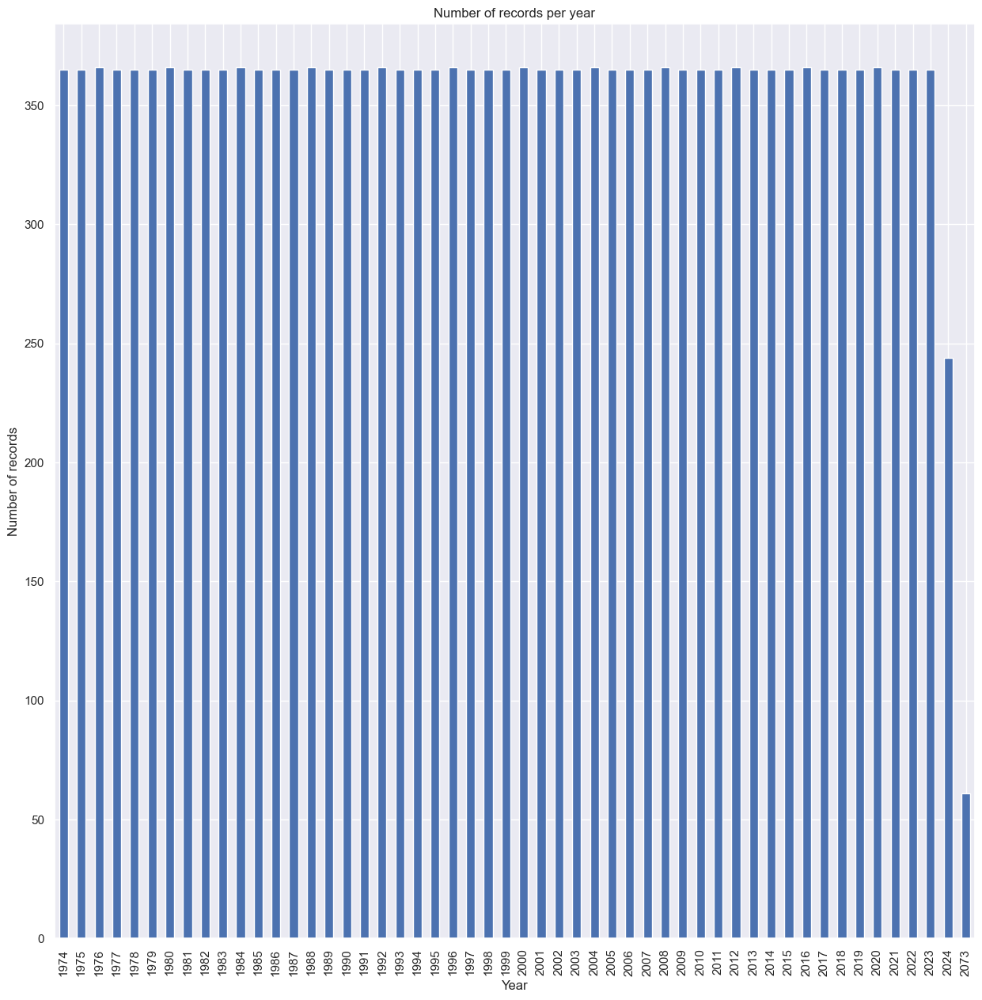

In [254]:
# finding out, if there a missing data:
# plot of records per year to find out, if there's a lot of missing data
water_level_per_year = df_water_level.groupby('year').size()

water_level_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [256]:
df_water_level_new = df_water_level[df_water_level['year'] <= 2024]
df_water_level_new

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month
61,01.01.74,46,54,38,1974-01-01,1974,1
62,02.01.74,44,55,35,1974-01-02,1974,1
63,03.01.74,51,55,47,1974-01-03,1974,1
64,04.01.74,56,64,45,1974-01-04,1974,1
65,05.01.74,53,57,33,1974-01-05,1974,1
...,...,...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27,2024,8
240,28.08.24,117,121,113,2024-08-28,2024,8
241,29.08.24,114,116,110,2024-08-29,2024,8
242,30.08.24,114,116,108,2024-08-30,2024,8


In [ ]:
# adding 3 columns: water alert level 1, 2, 3 and 4
# there are specific actions the city of munich take if the water level reaches one of them
# water alert level 1 = 240 cm, 300 cm, 380 cm, 520 cm

df_water_level_new['water_alert_level1'] = df_water_level_new['max_water_level']

In [306]:
def determine_alert(row):
	if (row['max_water_level'] > 520.0):
		return 4
	elif (row['max_water_level'] > 380.0):
	    return 3
	elif (row['max_water_level'] > 300.0):
		return 2
	elif (row['max_water_level'] > 240.0):
		return 1
	return 0


#Apply to each row
df_water_level_new['water_alert_level']=df_water_level_new.apply(determine_alert,axis=1)


In [309]:
df_water_level_new.isna().sum()

Datum                0
avg_water_level      0
max_water_level      0
min_water_level      0
date                 0
year                 0
month                0
water_alert_level    0
dtype: int64

In [307]:
df_water_level_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18506 entries, 61 to 243
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Datum              18506 non-null  object        
 1   avg_water_level    18506 non-null  int64         
 2   max_water_level    18506 non-null  int64         
 3   min_water_level    18506 non-null  int64         
 4   date               18506 non-null  datetime64[ns]
 5   year               18506 non-null  int32         
 6   month              18506 non-null  int32         
 7   water_alert_level  18506 non-null  int64         
dtypes: datetime64[ns](1), int32(2), int64(4), object(1)
memory usage: 1.1+ MB


In [308]:
df_water_level_new['water_alert_level'].value_counts()

water_alert_level
0    18336
1      116
2       36
3       17
4        1
Name: count, dtype: int64

In [305]:

df_water_level_new[df_water_level_new['max_water_level']>520.0]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level
11619,24.08.05,495,542,451,2005-08-24,2005,8,1


In [360]:
# creating 4 variables: 

def determine_alert1(row):
	if (row['water_alert_level'] == 1):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert1']=df_water_level_new.apply(determine_alert1,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 1]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
259,18.07.74,255,295,201,1974-07-18,1974,7,1,1,1.0,1.0,1.0,1,0
261,20.07.74,254,273,238,1974-07-20,1974,7,1,1,1.0,1.0,1.0,1,0
262,21.07.74,237,250,228,1974-07-21,1974,7,1,1,1.0,1.0,1.0,1,0
263,22.07.74,222,244,202,1974-07-22,1974,7,1,1,1.0,1.0,1.0,1,0
607,01.07.75,237,278,177,1975-07-01,1975,7,1,1,1.0,1.0,1.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,06.06.24,230,247,221,2024-06-06,2024,6,1,1,1.0,1.0,1.0,1,0
158,07.06.24,262,266,247,2024-06-07,2024,6,1,1,1.0,1.0,1.0,1,0
159,08.06.24,240,268,220,2024-06-08,2024,6,1,1,1.0,1.0,1.0,1,0
161,10.06.24,239,250,212,2024-06-10,2024,6,1,1,1.0,1.0,1.0,1,0


In [361]:
df_water_level_new['alert1'].value_counts()

alert1
0    18390
1      116
Name: count, dtype: int64

In [363]:
# creating 4 variables: 

def determine_alert2(row):
	if (row['water_alert_level'] == 2):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert2']=df_water_level_new.apply(determine_alert2,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 2]



,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
260,19.07.74,275,301,257,1974-07-19,1974,7,2,0,1,NaN,NaN,0,1
1369,01.08.77,286,330,195,1977-08-01,1977,8,2,0,1,NaN,NaN,0,1
2054,17.06.79,238,312,181,1979-06-17,1979,6,2,0,1,NaN,NaN,0,1
2057,20.06.79,304,322,283,1979-06-20,1979,6,2,0,1,NaN,NaN,0,1
2817,19.07.81,247,317,175,1981-07-19,1981,7,2,0,1,NaN,NaN,0,1
2821,23.07.81,308,358,267,1981-07-23,1981,7,2,0,1,NaN,NaN,0,1
4297,07.08.85,313,351,273,1985-08-07,1985,8,2,0,1,NaN,NaN,0,1
4298,08.08.85,299,347,273,1985-08-08,1985,8,2,0,1,NaN,NaN,0,1
7883,02.06.95,276,313,227,1995-06-02,1995,6,2,0,1,NaN,NaN,0,1
7884,03.06.95,316,334,296,1995-06-03,1995,6,2,0,1,NaN,NaN,0,1


In [364]:
df_water_level_new['alert2'].value_counts()

alert2
0    18470
1       36
Name: count, dtype: int64

In [365]:
# creating 4 variables: 

def determine_alert3(row):
	if (row['water_alert_level'] == 3):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert3']=df_water_level_new.apply(determine_alert3,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 3]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
2055,18.06.79,383,424,312,1979-06-18,1979,6,3,0,0,1,NaN,0,0
2056,19.06.79,358,402,322,1979-06-19,1979,6,3,0,0,1,NaN,0,0
2818,20.07.81,389,424,317,1981-07-20,1981,7,3,0,0,1,NaN,0,0
2819,21.07.81,387,395,382,1981-07-21,1981,7,3,0,0,1,NaN,0,0
2820,22.07.81,376,390,358,1981-07-22,1981,7,3,0,0,1,NaN,0,0
9333,22.05.99,442,469,334,1999-05-22,1999,5,3,0,0,1,NaN,0,0
9334,23.05.99,450,467,434,1999-05-23,1999,5,3,0,0,1,NaN,0,0
9335,24.05.99,432,436,425,1999-05-24,1999,5,3,0,0,1,NaN,0,0
9336,25.05.99,414,439,389,1999-05-25,1999,5,3,0,0,1,NaN,0,0
9337,26.05.99,350,391,311,1999-05-26,1999,5,3,0,0,1,NaN,0,0


In [366]:
df_water_level_new.alert3.value_counts()

alert3
0    18489
1       17
Name: count, dtype: int64

In [367]:
# creating 4 variables: 

def determine_alert4(row):
	if (row['water_alert_level'] == 4):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert4']=df_water_level_new.apply(determine_alert4,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 4]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
11619,24.08.05,495,542,451,2005-08-24,2005,8,4,0,0,0,1,0,0


In [368]:
df_water_level_new.to_csv("waterlevel.csv", sep=';', decimal=",", index=False)

In [405]:
df_water_level_new[df_water_level_new['month']==12].describe().T
                   # df_water_level_new['max_water_level']>200) &

,count,mean,min,25%,50%,75%,max,std
avg_water_level,1550.0,67.024516,20.0,48.0,61.0,82.0,206.0,27.55415
max_water_level,1550.0,74.153548,21.0,54.0,69.0,89.0,223.0,30.060123
min_water_level,1550.0,60.507097,16.0,43.0,54.0,75.0,188.0,25.581115
date,1550,1999-06-16 17:45:36,1974-12-01 00:00:00,1986-12-16 06:00:00,1999-06-16 12:00:00,2011-12-15 18:00:00,2023-12-31 00:00:00,NaN
year,1550.0,1998.5,1974.0,1986.0,1998.5,2011.0,2023.0,14.435527
month,1550.0,12.0,12.0,12.0,12.0,12.0,12.0,0.0
water_alert_level,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert1,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert2,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert3,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## DataFrame Floods (water level, flow rate and precitation)


In [ ]:
#

# Looking deeper into the data

In [193]:
# creating a report, automatically in an html-file:
profile_report_df_final = df_final.profile_report()
profile_report_df_final.to_file(output_file='output_df_final.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [194]:
profile_report_df_final

# HiER NOCHMAL CHECKEN UND DANN RAUSWERFEN!!!!

# ICE BATH
`ice_bath = 1, if...`
- `max water temperature: < 11 °C`
- `avg water level: < 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 65 m3/s`
- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`


In [ ]:
df_river.columns

Index(['date', 'avg_water_temperature', 'max_water_temperature',
       'min_water_temperature', 'avg_water_level', 'max_water_level',
       'min_water_level', 'suspended_solids_concentration',
       'suspended_solid_load', 'suspended_sediment_erosion',
       'suspended_sediment_transport', 'avg_flow_rate', 'max_flow_rate',
       'min_flow_rate', 'year', 'month'],
      dtype='object')

In [ ]:
df_ice_bath_river = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration', 'max_flow_rate']]
df_ice_bath_river

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,1980-11-01,8.1,71,5.57,63.4
1,1980-11-02,7.3,59,5.10,39.6
2,1980-11-03,5.8,68,5.14,60.0
3,1980-11-04,5.6,77,7.60,56.9
4,1980-11-05,4.8,77,9.03,66.5
...,...,...,...,...,...
15283,2024-08-27,17.6,130,34.95,76.7
15284,2024-08-28,19.0,117,34.95,53.0
15285,2024-08-29,19.6,114,34.95,46.1
15286,2024-08-30,19.8,114,34.95,46.1


In [ ]:
df_ice_bath_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 5 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   max_water_temperature           15288 non-null  float64       
 2   avg_water_level                 15288 non-null  int64         
 3   suspended_solids_concentration  15288 non-null  float64       
 4   max_flow_rate                   15288 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 597.3 KB


In [ ]:
df_ice_bath_river.isna().sum()

date                              0
max_water_temperature             0
avg_water_level                   0
suspended_solids_concentration    0
max_flow_rate                     0
dtype: int64

- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`

In [ ]:
df_ice_bath_weather = df_weather[['date', 'tmax', 'prcp', 'wspd', 'wpgt', 'snow']]
df_ice_bath_weather

,date,tmax,prcp,wspd,wpgt,snow
0,2011-06-01,13.3,4.2,14.00,44.60,0.0
1,2011-06-02,17.1,0.0,10.80,32.80,0.0
2,2011-06-03,23.8,0.0,15.10,43.60,0.0
3,2011-06-04,27.8,0.0,12.20,31.30,0.0
4,2011-06-05,27.1,4.7,9.70,67.70,0.0
...,...,...,...,...,...,...
2799,2024-09-01,29.5,0.0,7.20,22.00,0.0
2800,2024-09-02,27.2,0.0,7.60,30.20,0.0
2801,2024-09-03,28.9,0.0,5.40,18.70,0.0
2802,2024-09-04,NaN,NaN,8.43,29.83,0.0


In [ ]:
df_ice_bath_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tmax    4843 non-null   float64       
 2   prcp    4843 non-null   float64       
 3   wspd    4845 non-null   float64       
 4   wpgt    4845 non-null   float64       
 5   snow    4845 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 265.0 KB


In [ ]:
# rows in Septemeber 2024 I drop:
df_ice_bath_weather = df_ice_bath_weather[df_ice_bath_weather['date']<='2024-08-31']
df_ice_bath_weather


,date,tmax,prcp,wspd,wpgt,snow
0,2011-06-01,13.3,4.2,14.0,44.60,0.0
1,2011-06-02,17.1,0.0,10.8,32.80,0.0
2,2011-06-03,23.8,0.0,15.1,43.60,0.0
3,2011-06-04,27.8,0.0,12.2,31.30,0.0
4,2011-06-05,27.1,4.7,9.7,67.70,0.0
...,...,...,...,...,...,...
2794,2024-08-27,24.6,0.0,8.6,31.70,0.0
2795,2024-08-28,29.6,0.0,5.0,34.09,0.0
2796,2024-08-29,31.2,0.0,6.1,23.80,0.0
2797,2024-08-30,30.8,0.0,6.1,24.50,0.0


In [ ]:
#joining water and weather datasets by date:
df_ice_bath = pd.merge(df_ice_bath_weather, df_ice_bath_river, how='left', on='date')
df_ice_bath

,date,tmax,prcp,wspd,wpgt,snow,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,2011-06-01,13.3,4.2,14.0,44.60,0.0,16.1,107.0,126.14,192.0
1,2011-06-02,17.1,0.0,10.8,32.80,0.0,13.2,82.0,114.69,98.7
2,2011-06-03,23.8,0.0,15.1,43.60,0.0,14.8,62.0,90.89,60.0
3,2011-06-04,27.8,0.0,12.2,31.30,0.0,16.4,52.0,67.09,42.4
4,2011-06-05,27.1,4.7,9.7,67.70,0.0,17.1,49.0,43.29,43.6
...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,8.6,31.70,0.0,17.6,130.0,34.95,76.7
4836,2024-08-28,29.6,0.0,5.0,34.09,0.0,19.0,117.0,34.95,53.0
4837,2024-08-29,31.2,0.0,6.1,23.80,0.0,19.6,114.0,34.95,46.1
4838,2024-08-30,30.8,0.0,6.1,24.50,0.0,19.8,114.0,34.95,46.1


In [ ]:
df_ice_bath.isna().sum()

date                                0
tmax                                0
prcp                                0
wspd                                0
wpgt                                0
snow                                0
max_water_temperature             718
avg_water_level                   718
suspended_solids_concentration    718
max_flow_rate                     718
dtype: int64

## Adding a variable "ice_bath"
`ice_bath = 1, if...`
- `max water temperature: < 11 °C`
- `avg water level: < 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 65 m3/s`
- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`

In [ ]:
df_ice_bath['ice_bath'].value_counts()

ice_bath
0    3874
1     966
Name: count, dtype: int64

In [ ]:
df_ice_bath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   wspd                            4840 non-null   float64       
 4   wpgt                            4840 non-null   float64       
 5   snow                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
 10  ice_bath                        4840 non-null   int64         
dtypes: d

In [ ]:
df_ice_bath.to_csv("ice_bath.csv", index=False)

# TESTSTATION

## result over all columns by using OutLiersBox:
- variables with suspected outliers: Social support, Generosity, Perceptions of corruption
- should I substitute them with the frequent value? 

In [ ]:
# other observations for the outliers:
data_social_support = happy_data_clean['Social support']
data_social_support
sns.distplot(data_social_support)#, kde=True)
plt.title('Histogram of social support')
plt.show()

NameError: name 'happy_data_clean' is not defined

In [ ]:
# how much outliers are there in social Support?
Q1 = happy_data_clean['Social support'].quantile(.25)
Q3 = happy_data_clean['Social support'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For social support: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Social support']) < lower_limit]
num_outliers_social_support#.shape[0] #['Social support'].counts()

# Conclusion: only 7 outliers. delete?

In [ ]:
# how much outliers are there in perception of corruption?
Q1 = happy_data_clean['Perceptions of corruption'].quantile(.25)
Q3 = happy_data_clean['Perceptions of corruption'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For Perceptions of corruption: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Perceptions of corruption']) > upper_limit]
num_outliers_social_support.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 31 rows -> not that few. so I have to substitute the outliers with the mode? Median?

In [ ]:
# how much outliers are there in generosity?
Q1 = happy_data_clean['Generosity'].quantile(.25)
Q3 = happy_data_clean['Generosity'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For Generosity: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Generosity']) > upper_limit]
num_outliers_social_support#.shape[0] #['Generosity'].counts()

# Conclusion: only 4 rows. Delete?

In [ ]:
happy_data_IQR = happy_data_clean.copy()
for column in happy_data_IQR:
    #print(column)
    if happy_data_IQR[column].dtype != 'object':
        Q1 = happy_data_IQR[column].quantile(.25)
        Q3 = happy_data_IQR[column].quantile(.75)
        IQR = Q3 - Q1
        lower_limit = (Q1 - 1.5 * IQR)
        upper_limit = (Q3 + 1.5 * IQR)
        
        print(column,lower_limit, upper_limit)
        happy_data_IQR=happy_data_IQR[(happy_data_IQR[column] > lower_limit) &
                      (happy_data_IQR[column] < upper_limit)]

In [ ]:
data_social_support.describe()

In [ ]:
# using apply and lambda to do it for all columns faster.

happy_data_clean.apply(lambda col: OutLiersBox(happy_data_clean, happy_data_clean.columns[col]))

In [ ]:
# Exercise 1.Tell a story with your dataset, to try to answer the following question:

"Which factors are more important to live a happier life? As a result, people and countries can focus on the more significant factors to achieve a higher happiness level "

# To achieve this goal use the different funcionalities from 
# the visualization libraries that you have seen in the module

## Step 5: Formating the data for answering the questions
- creating new datasats, selected one
- trying out graphs

In [ ]:
# because there are 2 years I split the dataset in 2 years
happy_data_2018 = happy_data_clean[(happy_data.year == 2018)]
happy_data_2019 = happy_data_clean[(happy_data.year == 2019)]

In [ ]:
happy_data_2018

In [ ]:
happy_data_2019

In [ ]:
# nans in healthy life expectancy: are they distributed over the 2 years?
happy_data_2018['Healthy life expectancy'].isnull().sum()
happy_data_2018 = happy_data_2018.drop(columns='year')
happy_data_2018

In [ ]:
happy_data_2019['Healthy life expectancy'].isnull().sum()
happy_data_2019 = happy_data_2019.drop(columns='year')
happy_data_2019

In [ ]:
#looking into the dataset of Healthy life expectancy, where are values:
happy_data_2018_country_health = happy_data_2018[['Country or region', 'Healthy life expectancy']]
happy_data_2018_country_health['Healthy life expectancy'].unique()

# später weiter! Gerade nicht so wichtig.

In [ ]:
# numerical variables

numerical_happy_data = happy_data_clean.select_dtypes(include=['int64','float'])
numerical_happy_data
numerical_happy_data1 = numerical_happy_data.drop(columns="Healthy life expectancy")

In [ ]:
# categorical variables

categorical_happy_data = happy_data_clean.select_dtypes(include=['category', 'object'])
categorical_happy_data

In [ ]:
"Which factors are more important to live a happier life? As a result, people and countries can focus on the more significant factors to achieve a higher happiness level "

# To achieve this goal use the different funcionalities from 
# the visualization libraries that you have seen in the module

In [ ]:
# plotting correlations between the score and the dimensions
sns.pairplot(numerical_happy_data1)
plt.show()

In [ ]:
# because nothing works, I start with on variable: score and GDP per capita
#fig = sns.scatterplot(happy_data_2018, x='Score', y='GDP per capita')
#fig.show()
#Healthy life expectancy	Freedom to make life choices	Generosity	Perceptions of corruption

fig, ax = plt.subplot(3, 2, figsize=(20, 20))

# Option 1 : Scatter plot by default
sns.scatterplot(data=happy_data_clean, x='Score', y='GDP per capita', 
                alpha=0.7, ax=ax[0][0])


# Option 2 : Add a hue
sns.scatterplot(data=happy_data_clean, x='Score', y='Social support', 
                hue=df['gender'].to_list(),
                alpha=0.7, ax=ax[0][1])

# Option 3 : Add style & color
sns.scatterplot(data=happy_data_clean, x='Score', y='Freedom to make life choices', 
                style=df['gender'].to_list(), 
                color='green',
                alpha=0.5, ax=ax[1][0])

# Option 4 : add size & color 
sns.scatterplot(data=happy_data_clean, x='Score', y='Generosity', 
                size=df['parental level of education'].to_list(), 
                color='brown', alpha=0.5, ax=ax[1][1])
sns:scatterplot(data=happy_data_clean, x="Score", y=)

# Option 2 : Add a hue
sns.scatterplot(data=happy_data_clean, x='Score', y='Perception of corruption', 
                hue=df['gender'].to_list(),
                alpha=0.7, ax=ax[0][1])

plt.show()

In [ ]:
# - 2 Variables
# - visualizations is the focus
# - find questions I want to answer

In [ ]:
import plotly.express as px
fig = px.histogram(df_river, x="year", y="suspended_sediment_transport")
fig.show()

#suspended_solids_concentration  15258 non-null  object        
# 11  suspended_solid_load            15258 non-null  object        
## 12  suspended_sediment_erosion      15258 non-null  object        
# 13  suspended_sediment_transport    15258 non-null  object 

In [ ]:
# suspended solids under 20, 25
df_solids_under_25 = df_river[df_river['suspended_solids_concentration'] < 25]
df_solids_under_20 = df_river[df_river['suspended_solids_concentration'] <= 20]


In [ ]:
df_solids_under_20.shape[0]

12125

In [ ]:
df_solids_under_25.shape[0]

13104

In [ ]:
# river flow rate under 75
df_river_flowrate_under_50 = df_river[df_river['avg_flow_rate'] < 50]

In [ ]:
df_river_flowrate_under_50.shape[0]

7663

In [ ]:
# precipitation:
df_weather_prcp_under_40 = df_weather[df_weather['prcp']<40]

In [ ]:
df_weather_prcp_under_40.shape[0]

4821

In [ ]:
# temperature (avg) over 25°C
df_temp_over_25 = df_weather[df_weather['tmax']>=25]

In [ ]:
df_temp_over_25.shape[0]

873

In [ ]:
# distribution temperature:
fig_temp = px.histogram(df_weather, x="date", y="tavg")
fig_temp.show()

In [ ]:
# RIVER - water quality
# first loading all the files into seperate DataFrames for each variable
# Jan - August 2024:
path_water_quality = "../datasets/river/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.csv"
path_water_level = "../datasets/river/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0-1.csv"
path_daily_water_temperatures = "../datasets/river/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.csv"

df_river_flow_rate = pd.read_csv(path_river_flow_rate, sep=";")
#df_river_water_quality = pd.read_csv(path_water_quality, sep=";")
df_river_water_level = pd.read_csv(path_water_level, sep=";")
#df_river_daily_water_temperatures = pd.read_csv(path_daily_water_temperatures, sep=";")

df_river_flow_rate
#df_river_water_quality
#df_river_water_level
#df_river_daily_water_temperatures

# JOINING RIVER AND WEATHER

In [ ]:
df_merged = pd.merge(df_river, df_weather, how='left', on = 'date')
df_merged

ValueError: The column label 'date' is not unique.

In [ ]:
df_merged.shape

(15288, 27)

In [ ]:
df_merged.tail(20)

,date,month,year,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,...,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
15268,2024-08-12,8,2024,12.08.24,"20,6","21,3","19,8",108,114,104,...,25.5,18.4,31.7,0.0,0.0,49.0,5.8,28.1,1012.3,660.0
15269,2024-08-13,8,2024,13.08.24,"20,7","21,4","19,7",113,118,108,...,24.8,18.9,32.6,1.2,0.0,168.0,9.7,57.2,1010.2,656.0
15270,2024-08-14,8,2024,14.08.24,"20,2",21,"19,1",118,122,113,...,23.0,17.1,31.0,4.1,0.0,235.0,9.0,54.7,1011.6,654.0
15271,2024-08-15,8,2024,15.08.24,"19,8","20,8","18,5",134,144,117,...,22.4,16.7,28.2,0.0,0.0,38.0,6.5,23.8,1016.4,786.0
15272,2024-08-16,8,2024,16.08.24,"19,7","20,6","18,7",117,126,107,...,24.5,19.0,29.8,0.5,0.0,313.0,5.0,23.4,1015.1,558.0
15273,2024-08-17,8,2024,17.08.24,"19,8","20,3","19,1",115,121,106,...,22.4,19.1,26.1,2.4,0.0,309.0,6.1,27.4,1012.5,303.0
15274,2024-08-18,8,2024,18.08.24,"19,3","20,2","18,6",117,131,105,...,19.1,16.3,21.9,54.5,0.0,269.0,9.7,40.7,1009.0,20.0
15275,2024-08-19,8,2024,19.08.24,"17,5","18,6","16,7",167,192,127,...,15.7,14.6,17.0,5.7,0.0,293.0,9.7,31.7,1016.1,0.0
15276,2024-08-20,8,2024,20.08.24,"16,9","17,3","16,5",165,185,148,...,17.3,15.7,20.1,0.0,0.0,102.0,6.1,22.3,1013.5,59.0
15277,2024-08-21,8,2024,21.08.24,"17,3",18,"16,7",143,149,135,...,17.7,12.5,22.2,0.4,0.0,263.0,9.7,43.2,1016.6,276.0


In [ ]:
df_merged.head(30)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,...,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,...,107.0,153.0,52.0,"126,14","1803,93","0,64","20,88",116,192,"36,4"
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,...,82.0,98.0,69.0,"114,69","1619,08","0,57","18,74","74,9","98,7","57,1"
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,...,62.0,71.0,54.0,"90,89","1239,12","0,44","14,34",49,60,"38,7"
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,...,52.0,57.0,44.0,"67,09","859,16","0,3","9,94","36,7","42,4","28,6"
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,...,49.0,58.0,41.0,"43,29","479,2","0,17","5,55","33,5","43,6","25,7"
5,2011-06-06,16.9,12.7,24.6,13.1,NaN,244.0,8.6,55.1,1005.6,...,63.0,78.0,51.0,"21,59","134,88","0,05","1,56","49,9","70,4","35,2"
6,2011-06-07,19.4,12.1,25.2,0.0,NaN,121.0,9.0,34.9,1004.3,...,56.0,60.0,50.0,"16,26","68,38","0,02","0,79","41,8","45,5","34,6"
7,2011-06-08,15.5,12.5,19.3,1.9,NaN,261.0,12.6,51.5,1006.3,...,52.0,57.0,47.0,"14,4","60,78","0,02","0,7","37,3","42,3","31,7"
8,2011-06-09,13.7,12.3,15.4,0.4,NaN,310.0,7.6,19.8,1014.9,...,52.0,59.0,44.0,"12,55","53,18","0,02","0,62","37,5","45,2","28,5"
9,2011-06-10,14.4,10.9,18.6,0.0,NaN,329.0,6.8,21.2,1015.5,...,61.0,70.0,47.0,"11,2","48,66","0,02","0,56","48,3","59,6","31,4"


In [ ]:
df_merged.isna().sum()

date                                  0
month                                 0
year                                  0
Datum                                 0
avg_water_temperature                 0
max_water_temperature                 0
min_water_temperature                 0
avg_water_level                       0
max_water_level                       0
min_water_level                       0
suspended_solids_concentration       30
suspended_solid_load                 30
suspended_sediment_erosion           30
suspended_sediment_transport         30
avg_flow_rate                         0
max_flow_rate                         0
min_flow_rate                         0
tavg                              11166
tmin                              11166
tmax                              11166
prcp                              11169
snow                              13751
wdir                              11355
wspd                              11221
wpgt                              11222


In [ ]:
# looking only into the timeframe june 2011 until August 2024:
df_merged_2011_2024 = df_merged[(df_merged['date']>= '2011-06-01') & (df_merged['date']<='2024-08-31')]
df_merged_2011_2024

,date,month,year,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,...,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,6.0,2011.0,01.06.11,"14,3","16,1","12,9",107.0,153.0,52.0,...,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,6.0,2011.0,02.06.11,"12,8","13,2","12,5",82.0,98.0,69.0,...,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,6.0,2011.0,03.06.11,"13,6","14,8","12,7",62.0,71.0,54.0,...,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,6.0,2011.0,04.06.11,"15,1","16,4","13,9",52.0,57.0,44.0,...,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,6.0,2011.0,05.06.11,"16,3","17,1","15,3",49.0,58.0,41.0,...,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,8.0,2024.0,27.08.24,"16,6","17,6","15,8",130.0,137.0,121.0,...,18.3,12.9,24.6,0.0,NaN,87.0,8.6,31.7,1019.9,380.0
4836,2024-08-28,8.0,2024.0,28.08.24,"17,8",19,"16,6",117.0,121.0,113.0,...,21.3,14.3,29.6,0.0,NaN,NaN,5.0,NaN,1017.0,691.0
4837,2024-08-29,8.0,2024.0,29.08.24,"18,7","19,6","17,7",114.0,116.0,110.0,...,22.9,15.6,31.2,0.0,NaN,138.0,6.1,23.8,1017.4,773.0
4838,2024-08-30,8.0,2024.0,30.08.24,"19,1","19,8","18,1",114.0,116.0,108.0,...,22.5,15.2,30.8,0.0,NaN,93.0,6.1,24.5,1016.9,763.0


In [ ]:
df_merged_2011_2024.isna().sum()

date                                 0
month                              718
year                               718
Datum                              718
avg_water_temperature              718
max_water_temperature              718
min_water_temperature              718
avg_water_level                    718
max_water_level                    718
min_water_level                    718
suspended_solids_concentration     748
suspended_solid_load               748
suspended_sediment_erosion         748
suspended_sediment_transport       748
avg_flow_rate                      718
max_flow_rate                      718
min_flow_rate                      718
tavg                                 0
tmin                                 0
tmax                                 0
prcp                                 3
snow                              2745
wdir                               190
wspd                                55
wpgt                                57
pres                     

In [ ]:
df_river_nans = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration','max_flow_rate']][
    (df_river['month'].isna() | 
     df_river['year'].isna() | 
     df_river['max_water_temperature'].isna() |
     df_river['avg_water_level'].isna() | 
     df_river['suspended_solids_concentration'].isna() | 
     df_river['max_flow_rate'].isna()
     )
     ]
df_river_nans.tail(30)

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
14513,2022-07-19,20.5,94,NaN,42.6
14514,2022-07-20,21.4,99,NaN,47.3
14515,2022-07-21,21.3,98,NaN,41.6
14516,2022-07-22,20.5,92,NaN,34.4
14517,2022-07-23,20.4,89,NaN,30.9
14518,2022-07-24,20.7,89,NaN,33.5
14519,2022-07-25,21.5,89,NaN,31.7
14520,2022-07-26,21.3,100,NaN,49.8
14521,2022-07-27,19.7,93,NaN,34.4
14522,2022-07-28,20.2,93,NaN,38.3


In [ ]:
df_swimming_nans = df_swimming[
    (df_swimming['month'].isna() | 
     df_swimming['year'].isna() | 
     df_swimming['max_water_temperature'].isna() |
     df_swimming['avg_water_level'].isna() | 
     df_swimming['suspended_solids_concentration'].isna() | 
     df_swimming['max_flow_rate'].isna()
     )
     ]
df_swimming_nans.head()


,date,tmax,prcp,wspd,wpgt,month,year,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
401,2012-07-06,24.6,18.5,8.6,32.4,NaN,NaN,NaN,NaN,NaN,NaN
402,2012-07-07,24.5,0.6,7.9,22.7,NaN,NaN,NaN,NaN,NaN,NaN
403,2012-07-08,26.5,2.5,11.2,62.3,NaN,NaN,NaN,NaN,NaN,NaN
404,2012-07-09,24.2,0.0,6.1,22.3,NaN,NaN,NaN,NaN,NaN,NaN
405,2012-07-10,26.8,0.3,7.9,27.7,NaN,NaN,NaN,NaN,NaN,NaN
